# Predictive Modeling of User Demographics for TalkingData's Mobile User 


## Methodology
1. Data collection
2. Exploratory Data Analysis (EDA) and Class balancing
3. Supervised Learning

    1. SelectKbest
        1. GridsearchCV with all models (RandomForest, SVM, KNN).
        2. Evaluate using classification report, confusion matrix, cross-validation

    2. PCA
        1. GridsearchCV with all models (RandomForest, SVM, KNN).
        2. Evaluate using classification report, confusion matrix, cross-validation
    3. Write up analysis and comparison
4. Unsupervised Learning Approach

    1. Using PCA and K-means to do the clustering (visualizations and many clusters, justify using silhouette scores)
    2. For PCA/K-means (K>= 4), draw the bar graphs to answer the following questions:
        1. Which cluster contains the most usage by females between 27 and 32?
        2. Which cluster contains the most device variety by males between 29 and 38?
    3. Using t-SNE and GMM to do the clustering (visualizations and many clusters, justify using silhouette scores)
    4. For t-SNE/GMM (K>= 4), draw the bar graphs to answer the following questions:
        1. Which cluster contains the most usage by females between 27 and 32?
        2. Which cluster contains the most device variety by males between 29 and 38?
    5. Write up the comparison analysis.
5. Deep Learning

    1. Try different ANN models and train them on the training set with the following:
        1. Number of layers
        2. Activation functions of the layers
        3. Number of neurons in the layers
        4. Different batch sizes during training

    2. CNN & RNN
        1. with unbalanced dataset show classification report
        2. with balanced dataset show classification report
    3. Use the best performing model from supervised learning together with CNN and RNN
    4. Compare the models' training scores and interpret the results.
    5. Evaluate how the models perform on the test set. Compare the results of the models.
    6. Conclusions and recommendations




## 1. Data Collection

### Import necessary Libraries

In [ ]:
# Import necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import ttest_ind
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, classification_report, confusion_matrix
from statsmodels.tools.eval_measures import mse, rmse
from scipy.spatial import distance
import scipy
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

import time
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

from google.colab import drive
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.utils import to_categorical
from tensorflow import keras


import warnings

warnings.filterwarnings('ignore')

### Set up environment

In [ ]:
# Set up environment
# 1. Data Collection:
import os

drive.mount('/content/drive')

# Directory where main Capstone files are located
capstone_dir = '/content/drive/My Drive/Data Science/Capstone4'

# Directory where all CSV files are located
csv_dir = f'{capstone_dir}/data'

# Get all CSV files in the directory
all_csv_files = [file for file in os.listdir(csv_dir) if file.endswith('.csv')]
print(f"Total number of CSV files containing 'Talkingdata Mobile User Demographics' data: {len(all_csv_files)}")

# Create an empty list to store individual dataframes
# list_of_dataframes = []
datasets = {}




Mounted at /content/drive
Total number of CSV files containing 'Talkingdata Mobile User Demographics' data: 6


## 2. Exploratory data analysis (EDA)

  
  

  



### 1. Data exploration & Feature Engineering

#### 1.1 Load the raw CSV files to create datasets

In [ ]:
# Step 1: load the datasets
# Loop through all CSV files and read them into individual dataframes
for csv_file in all_csv_files:
    filepath = os.path.join(csv_dir, csv_file)
    df = pd.read_csv(filepath)
    key = csv_file.replace(".csv", "_data")
    datasets[key] = df
    print("---------------")
    print(f"{key} has the following rows and columns: {df.shape} ")
    print(df.head())
    df.info()


---------------
gender_age_train_data has the following rows and columns: (74645, 4) 
             device_id gender  age   group
0 -8076087639492063270      M   35  M32-38
1 -2897161552818060146      M   35  M32-38
2 -8260683887967679142      M   35  M32-38
3 -4938849341048082022      M   30  M29-31
4   245133531816851882      M   30  M29-31
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB
---------------
events_data has the following rows and columns: (3252950, 5) 
   event_id            device_id            timestamp  longitude  latitude
0         1    29182687948017175  2016-05-01 00:55:25     121.38     31.24
1         2 -6401643145415154744  20

#### 1.2 Merge the datasets

In [ ]:
# Step 2: Merge the datasets
merged_data = pd.merge(datasets['events_data'], datasets['phone_brand_device_model_data'], on='device_id', how='inner')
merged_data = pd.merge(merged_data, datasets['gender_age_train_data'], on='device_id', how='inner')
# merged_data = pd.merge(merged_data, datasets['label_categories_data'], on='label_id', how='inner')
merged_data.info()
merged_data.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1220474 entries, 0 to 1220473
Data columns (total 10 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   event_id      1220474 non-null  int64  
 1   device_id     1220474 non-null  int64  
 2   timestamp     1220474 non-null  object 
 3   longitude     1220474 non-null  float64
 4   latitude      1220474 non-null  float64
 5   phone_brand   1220474 non-null  object 
 6   device_model  1220474 non-null  object 
 7   gender        1220474 non-null  object 
 8   age           1220474 non-null  int64  
 9   group         1220474 non-null  object 
dtypes: float64(2), int64(3), object(5)
memory usage: 102.4+ MB


,event_id,device_id,timestamp,longitude,latitude,phone_brand,device_model,gender,age,group
0,1,29182687948017175,2016-05-01 00:55:25,121.38,31.24,小米,红米note,M,46,M39+
1,7104,29182687948017175,2016-05-02 09:37:02,121.38,31.24,小米,红米note,M,46,M39+
2,29661,29182687948017175,2016-05-04 00:56:04,121.39,31.23,小米,红米note,M,46,M39+
3,33133,29182687948017175,2016-05-06 05:01:15,121.38,31.24,小米,红米note,M,46,M39+
4,38980,29182687948017175,2016-05-06 09:55:04,121.16,31.00,小米,红米note,M,46,M39+


In [ ]:
print(merged_data.isnull().sum())

event_id        0
device_id       0
timestamp       0
longitude       0
latitude        0
phone_brand     0
device_model    0
gender          0
age             0
group           0
dtype: int64


#### 1.3 Data Cleaning & Processing




In [ ]:
# Step 3: Data Cleaning and Preprocessing
# no null entries so proceed to duplicates.
#Handling Duplicate Entries
merged_data.drop_duplicates(inplace=True)

#Convert the 'timestamp' column to a datetime data type and adding more datetime fields:
merged_data['timestamp'] = pd.to_datetime(merged_data['timestamp'])
merged_data['date'] = merged_data['timestamp'].dt.date
merged_data['date'] = pd.to_datetime(merged_data['date'])
merged_data['time'] = merged_data['timestamp'].dt.time
merged_data['day'] = merged_data['timestamp'].dt.day

#Memory Optimization
merged_data['device_id'] = merged_data['device_id'].astype('int32')
merged_data['age'] = merged_data['age'].astype('int8')
merged_data['day'] = merged_data['day'].astype('int8')
merged_data.info()
merged_data.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1215616 entries, 0 to 1220473
Data columns (total 15 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   event_id      1215616 non-null  int64         
 1   device_id     1215616 non-null  int32         
 2   timestamp     1215616 non-null  datetime64[ns]
 3   longitude     1215616 non-null  float64       
 4   latitude      1215616 non-null  float64       
 5   phone_brand   1215616 non-null  object        
 6   device_model  1215616 non-null  object        
 7   gender        1215616 non-null  object        
 8   age           1215616 non-null  int8          
 9   group         1215616 non-null  object        
 10  date          1215616 non-null  object        
 11  time          1215616 non-null  object        
 12  day_of_week   1215616 non-null  object        
 13  day           1215616 non-null  int8          
 14  age_group     1215616 non-null  category      
dty

,event_id,device_id,timestamp,longitude,latitude,phone_brand,device_model,gender,age,group,date,time,day_of_week,day,age_group
0,1,79400471,2016-05-01 00:55:25,121.38,31.24,小米,红米note,M,46,M39+,2016-05-01,00:55:25,Sunday,1,46-60
1,7104,79400471,2016-05-02 09:37:02,121.38,31.24,小米,红米note,M,46,M39+,2016-05-02,09:37:02,Monday,2,46-60
2,29661,79400471,2016-05-04 00:56:04,121.39,31.23,小米,红米note,M,46,M39+,2016-05-04,00:56:04,Wednesday,4,46-60
3,33133,79400471,2016-05-06 05:01:15,121.38,31.24,小米,红米note,M,46,M39+,2016-05-06,05:01:15,Friday,6,46-60
4,38980,79400471,2016-05-06 09:55:04,121.16,31.00,小米,红米note,M,46,M39+,2016-05-06,09:55:04,Friday,6,46-60


In [ ]:
# Step 4: Creating the age_group column
# Creating age groups based on the age column.
def age_group(age):
    if age < 20:
        return '19-'
    elif 20 <= age < 30:
        return '20+'
    elif 30 <= age < 40:
        return '30+'
    elif 40 <= age < 50:
        return '40+'
    else:
        return '50+'

# Applying the function to create a new age group column
merged_data['age_group'] = merged_data['age'].apply(age_group)

In [ ]:
# Step 5: Checking the counts of each new age group
print(gender_age_data['age_group'].value_counts())

# Create 'group' field by concatenating 'gender' and 'age_group'
gender_age_data['group'] = gender_age_data['gender'] + gender_age_data['age_group'].astype(str)

20+    482675
30+    419373
40+    194653
50+     84237
19-     22293
Name: age_group, dtype: int64


#### 1.4. Class balancing and Store to CSV for subsequent uses

In [ ]:
# Encode categorical columns
label_encoder = LabelEncoder()
gender_age_data['is_male'] = label_encoder.fit_transform(gender_age_data['gender'])
gender_age_data['phone_brand_id'] = label_encoder.fit_transform(gender_age_data['phone_brand'])
gender_age_data['device_model_id'] = label_encoder.fit_transform(gender_age_data['device_model'])
gender_age_data['age_group_id'] = label_encoder.fit_transform(gender_age_data['age_group'])

#extract features like year, month, day, etc., from the timestamp
gender_age_data['year'] = gender_age_data['date'].dt.year
gender_age_data['month'] = gender_age_data['date'].dt.month
gender_age_data['day'] = gender_age_data['date'].dt.day

# Now drop the original 'date' column
gender_age_data = gender_age_data.drop(columns=['date'])

gender_age_data['time'] = pd.to_datetime(gender_age_data['time']).dt.time
#extract separate features from the time object
gender_age_data['hour'] = gender_age_data['time'].apply(lambda x: x.hour)
gender_age_data['minute'] = gender_age_data['time'].apply(lambda x: x.minute)
gender_age_data['second'] = gender_age_data['time'].apply(lambda x: x.second)

#drop time
gender_age_data = gender_age_data.drop(columns=['time'])

#Memory Optimization
gender_age_data['device_id'] = gender_age_data['device_id']
gender_age_data['age'] = gender_age_data['age']
# gender_age_data['day'] = gender_age_data['day'].astype('int8')

gender_age_data.info()
print(gender_age_data.head())



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1203231 entries, 0 to 1203230
Data columns (total 17 columns):
 #   Column           Non-Null Count    Dtype 
---  ------           --------------    ----- 
 0   device_id        1203231 non-null  int64 
 1   gender           1203231 non-null  object
 2   age              1203231 non-null  int64 
 3   age_group        1203231 non-null  object
 4   phone_brand      1203231 non-null  object
 5   device_model     1203231 non-null  object
 6   day              1203231 non-null  int64 
 7   is_male          1203231 non-null  int64 
 8   phone_brand_id   1203231 non-null  int64 
 9   device_model_id  1203231 non-null  int64 
 10  age_group_id     1203231 non-null  int64 
 11  year             1203231 non-null  int64 
 12  month            1203231 non-null  int64 
 13  hour             1203231 non-null  int64 
 14  minute           1203231 non-null  int64 
 15  second           1203231 non-null  int64 
 16  group            1203231 non-null  o

In [ ]:
gender_age_data['group_id'] = label_encoder.fit_transform(gender_age_data['group'])

In [ ]:
gender_age_data.info()
gender_age_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1203231 entries, 0 to 1203230
Data columns (total 18 columns):
 #   Column           Non-Null Count    Dtype 
---  ------           --------------    ----- 
 0   device_id        1203231 non-null  int64 
 1   gender           1203231 non-null  object
 2   age              1203231 non-null  int64 
 3   age_group        1203231 non-null  object
 4   phone_brand      1203231 non-null  object
 5   device_model     1203231 non-null  object
 6   day              1203231 non-null  int64 
 7   is_male          1203231 non-null  int64 
 8   phone_brand_id   1203231 non-null  int64 
 9   device_model_id  1203231 non-null  int64 
 10  age_group_id     1203231 non-null  int64 
 11  year             1203231 non-null  int64 
 12  month            1203231 non-null  int64 
 13  hour             1203231 non-null  int64 
 14  minute           1203231 non-null  int64 
 15  second           1203231 non-null  int64 
 16  group            1203231 non-null  o

,device_id,gender,age,age_group,phone_brand,device_model,day,is_male,phone_brand_id,device_model_id,age_group_id,year,month,hour,minute,second,group,group_id
0,79400471,M,46,40+,小米,红米note,1,1,34,864,3,2016,5,0,55,25,M40+,8
1,79400471,M,46,40+,小米,红米note,2,1,34,864,3,2016,5,9,37,2,M40+,8
2,79400471,M,46,40+,小米,红米note,4,1,34,864,3,2016,5,0,56,4,M40+,8
3,79400471,M,46,40+,小米,红米note,6,1,34,864,3,2016,5,5,1,15,M40+,8
4,79400471,M,46,40+,小米,红米note,6,1,34,864,3,2016,5,9,55,4,M40+,8


In [ ]:
gender_age_data.to_csv(f'{capstone_dir}/full_talking_data_mobile_user.csv', index=False)

#### 1.5 Create a subset and Store to CSV for subsequent uses

In [ ]:
#Create a subset of the data
subset_gender_age_data = gender_age_data.sample(frac=0.1, random_state=1)

# Save the subset_gender_age_data dataset to a CSV file (optional)
subset_gender_age_data.to_csv(f'{capstone_dir}/talking_data_mobile_user.csv', index=False)

subset_gender_age_data.info()
subset_gender_age_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120323 entries, 0 to 120322
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   device_id        120323 non-null  int64 
 1   gender           120323 non-null  object
 2   age              120323 non-null  int64 
 3   age_group        120323 non-null  object
 4   phone_brand      120323 non-null  object
 5   device_model     120323 non-null  object
 6   day              120323 non-null  int64 
 7   is_male          120323 non-null  int64 
 8   phone_brand_id   120323 non-null  int64 
 9   device_model_id  120323 non-null  int64 
 10  age_group_id     120323 non-null  int64 
 11  year             120323 non-null  int64 
 12  month            120323 non-null  int64 
 13  hour             120323 non-null  int64 
 14  minute           120323 non-null  int64 
 15  second           120323 non-null  int64 
 16  group            120323 non-null  object
 17  group_id  

,device_id,gender,age,age_group,phone_brand,device_model,day,is_male,phone_brand_id,device_model_id,age_group_id,year,month,hour,minute,second,group,group_id
0,-1127415461,F,25,20+,魅族,MX2,7,0,87,416,1,2016,5,9,33,48,F20+,1
1,-2144834217,F,32,30+,魅族,MX4,1,0,87,418,2,2016,5,10,27,25,F30+,2
2,-576592613,F,23,20+,OPPO,R7,1,0,4,517,1,2016,5,22,39,17,F20+,1
3,-329836638,F,39,30+,vivo,X5Max+,2,0,8,684,2,2016,5,18,30,34,F30+,2
4,-890951709,M,35,30+,OPPO,R7,4,1,4,517,2,2016,5,14,37,48,M30+,7


#### 1.6 Visualize data of Selected features

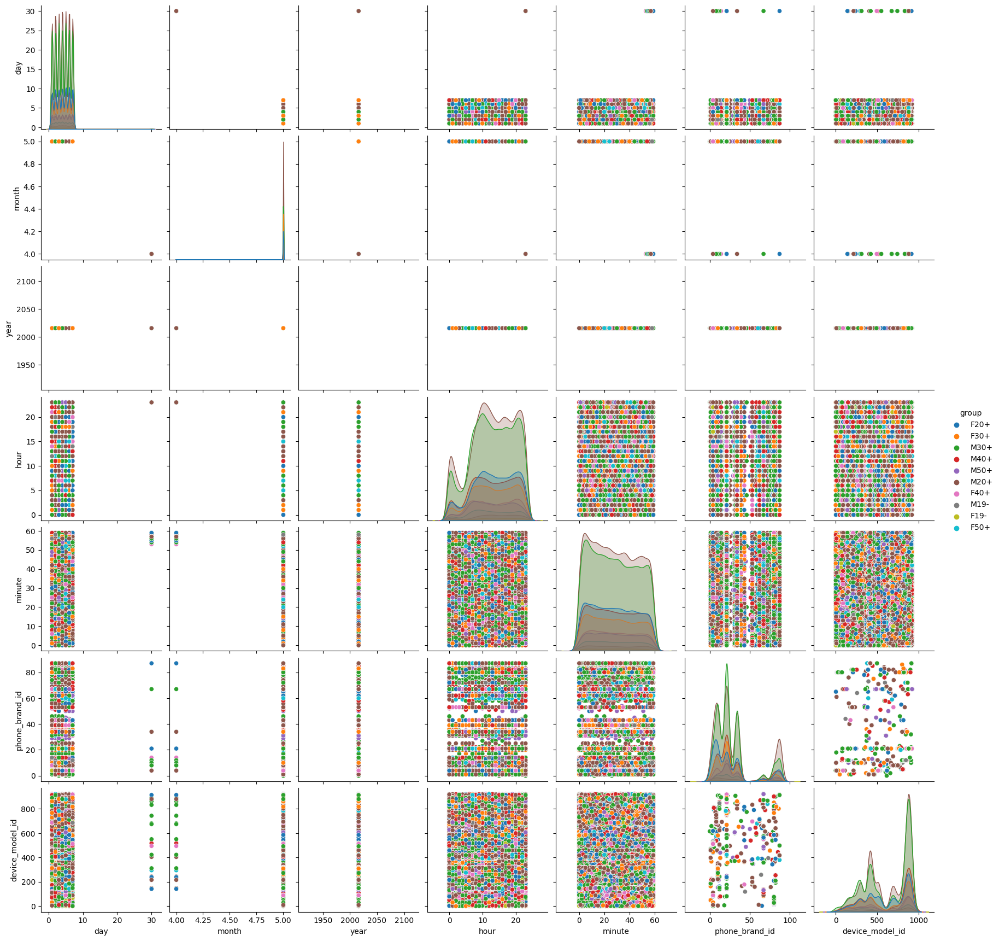

In [ ]:
# Creating pairplot to visualize relationships among the 'day', 'month', 'year', 'hour', 'minute', 'phone_brand_id', 'device_model_id' and group(the gender-age combo)
features = ['group', 'day', 'month', 'year', 'hour', 'minute', 'phone_brand_id', 'device_model_id']
data = subset_gender_age_data[features]

sns.pairplot(data, hue='group')
plt.show()

### 2. Read cleaned data from CSV in all subsequent uses

In [ ]:
# From here, since the clean dataset is already created, always start here when the runtime times out.
# Since Data is already created, start from here going forward
#1. Load the dataset and conduct any necessary preprocessing, such as normalizing the data.

drive.mount('/content/drive')

full_talking_data_df = pd.read_csv(f'{capstone_dir}/full_talking_data_mobile_user.csv')
talking_data_df = pd.read_csv(f'{capstone_dir}/talking_data_mobile_user.csv')
print(f"The shape of the full talking data is: {full_talking_data_df.shape}")

full_talking_data_df.info()
print(full_talking_data_df.head())

print(f"The shape of the talking data is: {talking_data_df.shape}")
talking_data_df.info()
talking_data_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
The shape of the full talking data is: (1203231, 18)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1203231 entries, 0 to 1203230
Data columns (total 18 columns):
 #   Column           Non-Null Count    Dtype 
---  ------           --------------    ----- 
 0   device_id        1203231 non-null  int64 
 1   gender           1203231 non-null  object
 2   age              1203231 non-null  int64 
 3   age_group        1203231 non-null  object
 4   phone_brand      1203231 non-null  object
 5   device_model     1203231 non-null  object
 6   day              1203231 non-null  int64 
 7   is_male          1203231 non-null  int64 
 8   phone_brand_id   1203231 non-null  int64 
 9   device_model_id  1203231 non-null  int64 
 10  age_group_id     1203231 non-null  int64 
 11  year             1203231 non-null  int64 
 12  month            1203231 non-null  int64 


,device_id,gender,age,age_group,phone_brand,device_model,day,is_male,phone_brand_id,device_model_id,age_group_id,year,month,hour,minute,second,group,group_id
0,-1127415461,F,25,20+,魅族,MX2,7,0,87,416,1,2016,5,9,33,48,F20+,1
1,-2144834217,F,32,30+,魅族,MX4,1,0,87,418,2,2016,5,10,27,25,F30+,2
2,-576592613,F,23,20+,OPPO,R7,1,0,4,517,1,2016,5,22,39,17,F20+,1
3,-329836638,F,39,30+,vivo,X5Max+,2,0,8,684,2,2016,5,18,30,34,F30+,2
4,-890951709,M,35,30+,OPPO,R7,4,1,4,517,2,2016,5,14,37,48,M30+,7


In [ ]:
full_talking_data_df['age_group'].value_counts()

20+    482675
30+    419373
40+    194653
50+     84237
19-     22293
Name: age_group, dtype: int64

In [ ]:
talking_data_df['age_group'].value_counts()

20+    48250
30+    41676
40+    19492
50+     8596
19-     2309
Name: age_group, dtype: int64

In [ ]:
talking_data_df['group'].value_counts()

M20+    34007
M30+    31090
F20+    14243
M40+    13365
F30+    10586
F40+     6127
M50+     5567
F50+     3029
M19-     1610
F19-      699
Name: group, dtype: int64

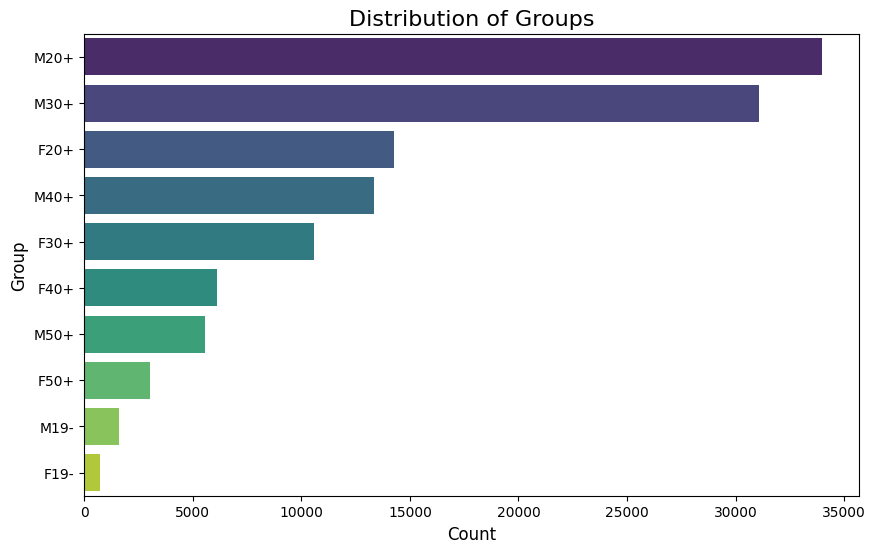

In [ ]:
group_counts = talking_data_df['group'].value_counts().reset_index()
group_counts.columns = ['group', 'count']

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='group', data=group_counts, palette='viridis')

# Add title and labels
plt.title('Distribution of Groups', fontsize=16)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Group', fontsize=12)

# Show plot
plt.show()

I will have to balance the data as there seems to be a class imbalance.

In [ ]:
research_features = ['group_id', 'day', 'month', 'year', 'hour', 'minute', 'phone_brand_id', 'device_model_id']
research_data = talking_data_df[research_features]
selected_features = ['day', 'month', 'year', 'hour', 'minute', 'phone_brand_id', 'device_model_id']


## 3. Supervised Learning
    1. SelectKbest
      1. GridsearchCV with all models (RandomForest, SVM, KNN).
      2. Evaluate using classification report, confusion matrix, cross-validation
    2. PCA
      1. GridsearchCV with all models (RandomForest, SVM, KNN).
      2. Evaluate using classification report, confusion matrix, cross-validation
    3. Write up analysis and comparison

### 3.1 Split data into features (X) and target variable(Y), then divide into train and test data, then visualize the correlation matrix

In [ ]:
#Create a new DataFrame X with just selected features
X = talking_data_df[selected_features]

# create target variable
y = talking_data_df['group_id']

#Split the data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


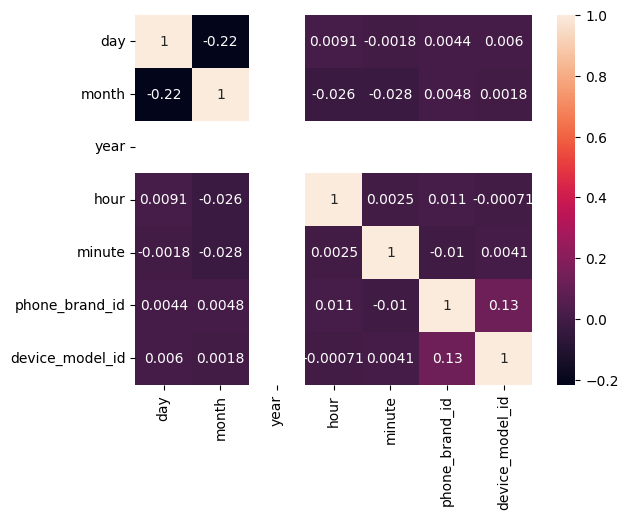

In [ ]:
# Map the correlation matrix of the data
correlation_matrix = X.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()

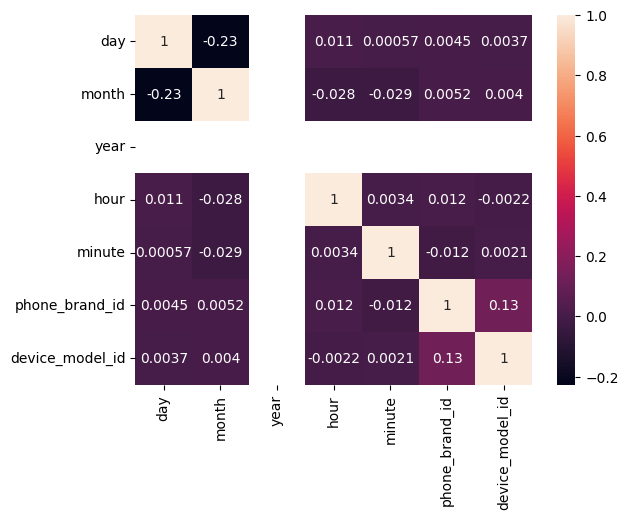

In [ ]:
correlation_matrix = X_train.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()

### 3.2 Before using SelectKBest, train different classifiers and evaluate using the test set

In [ ]:
#train different classifiers on the training set and evaluate them on the test set.
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predictions
y_pred = clf.predict(X_test)

# Evaluation
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.36      0.19      0.25       141
           1       0.35      0.31      0.33      2807
           2       0.31      0.23      0.27      2193
           3       0.28      0.20      0.24      1193
           4       0.25      0.16      0.20       575
           5       0.29      0.16      0.21       335
           6       0.43      0.52      0.47      6820
           7       0.42      0.48      0.45      6163
           8       0.34      0.28      0.31      2727
           9       0.28      0.19      0.23      1111

    accuracy                           0.39     24065
   macro avg       0.33      0.27      0.29     24065
weighted avg       0.37      0.39      0.38     24065



### 3.3 SelectKBest


In [ ]:
selector = SelectKBest(score_func=f_classif, k='all')  # select all features to get their scores


#### 3.3.1 Feature Selection Using SelectKBest selector

In [ ]:
# 1. Feature Selection
X_new = selector.fit_transform(X_train, y_train)

# Print the scores for each feature
for i, score in enumerate(selector.scores_):
    print(f"Feature {X_train.columns[i]}: {score}")

Feature day: 1.9275407127162885
Feature month: 0.597699670512893
Feature year: nan
Feature hour: 9.31193350342563
Feature minute: 1.5964115369727685
Feature phone_brand_id: 61.63047746664381
Feature device_model_id: 29.18397787221003


The scores represent the importance or relevance of each feature in predicting the target variable (group_id). A higher score indicates a higher relevance:

* day: 1.93 - This indicates that the "day" feature has a relatively low correlation with the target variable, based on its F-score.
* month: 0.60 - Similar to the "day" feature, the "month" feature also has a low correlation with the target variable.
* year: nan - The score is not a number, indicating that this feature probably has constant values, and thus, cannot be used in the classification. You might want to consider removing this feature from your dataset.
* hour: 9.31 - This feature has a somewhat higher correlation compared to "day" and "month", but it is still relatively low.
* minute: 1.60 - This feature again has a low correlation with the target variable, similar to "day" and "month".
* phone_brand_id: 61.63 - This feature has a higher F-score, indicating a higher correlation with the target variable. It seems like an important feature for your model.
* device_model_id: 29.18 - This feature has a moderate correlation with the target variable based on its F-score.

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96258 entries, 38431 to 15795
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   day              96258 non-null  int64
 1   month            96258 non-null  int64
 2   year             96258 non-null  int64
 3   hour             96258 non-null  int64
 4   minute           96258 non-null  int64
 5   phone_brand_id   96258 non-null  int64
 6   device_model_id  96258 non-null  int64
dtypes: int64(7)
memory usage: 5.9 MB


In [ ]:
X_train['year'].unique()

array([2016])

year has only 1 value = 2016 so not useful.

Split the data again using only the relevant features

In [ ]:
#Recreate the DataFrame X with just selected features
selected_features1 = ['day', 'hour', 'minute', 'phone_brand_id', 'device_model_id']
X = talking_data_df[selected_features1]

# create target variable
y = talking_data_df['group_id']

#Split the data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Feature Selection
selector = SelectKBest(score_func=f_classif, k='all')  # select all features to get their scores
X_new = selector.fit_transform(X_train, y_train)

# Print the scores for each feature
for i, score in enumerate(selector.scores_):
    print(f"Feature {X_train.columns[i]}: {score}")

Feature day: 1.9275407127162885
Feature hour: 9.31193350342563
Feature minute: 1.5964115369727685
Feature phone_brand_id: 61.63047746664381
Feature device_model_id: 29.18397787221003


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120323 entries, 0 to 120322
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   day              120323 non-null  int64
 1   hour             120323 non-null  int64
 2   minute           120323 non-null  int64
 3   phone_brand_id   120323 non-null  int64
 4   device_model_id  120323 non-null  int64
dtypes: int64(5)
memory usage: 4.6 MB


#### 3.3.2 GridSearchCV with different models
(RandomForest, SVM, KNN)

##### 3.3.2.1 SelectKBest & RandomForest

In [ ]:
try:
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [50, 100, 200],
      'max_depth': [None, 10, 20, 30],
      'min_samples_split': [2, 5, 10]
    },
    cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for RandomForest: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for RandomForest:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for RandomForest:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for RandomForest:")
    print(cross_val_score(RandomForestClassifier(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model RandomForest: {e}")

Best parameters for RandomForest: {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 200}

Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.67      0.13      0.21       141
           1       0.45      0.27      0.34      2807
           2       0.48      0.17      0.25      2193
           3       0.48      0.17      0.25      1193
           4       0.52      0.08      0.14       575
           5       0.60      0.10      0.18       335
           6       0.41      0.64      0.50      6820
           7       0.40      0.56      0.47      6163
           8       0.43      0.23      0.30      2727
           9       0.50      0.15      0.23      1111

    accuracy                           0.42     24065
   macro avg       0.49      0.25      0.29     24065
weighted avg       0.44      0.42      0.39     24065

Confusion Matrix for RandomForest:
[[  18   22    1    1    0    1   66   27    5    0]
 [   2  763   5

**Best Parameters:**

The best parameters obtained from the grid search for the Random Forest model are as follows:

* max_depth: 30 - This suggests that allowing the trees in the forest to have a maximum depth of 30 gave the best performance during the cross-validation in the grid search.
* min_samples_split: 5 - This means that the minimum number of samples required to split an internal node is 5.
* n_estimators: 200 - This means that the best performance was obtained when using 200 trees in the forest.

**Classification Report:**

Classes have considerably varied precision and recall values, indicating that the model is having difficulty in distinguishing between the different classes. The precision and recall for class 0 are particularly low, which suggests that the model is struggling to correctly identify this class.


**Cross-Validation Scores:**

[0.31214161 0.3101471  0.3191622 ] The cross-validation scores are consistent but low, indicating that the model is not overfitting but is not performing well either.



###### 3.3.2.1.0 Balancing with SMOTE and using 40% with the best parameters

In [ ]:
y.value_counts()

6    34007
7    31090
1    14243
8    13365
2    10586
3     6127
9     5567
4     3029
5     1610
0      699
Name: group_id, dtype: int64

In [ ]:
# Applying SMOTE
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)
y_train_balanced.value_counts()

3    27187
7    27187
1    27187
5    27187
6    27187
8    27187
2    27187
9    27187
4    27187
0    27187
Name: group_id, dtype: int64

In [ ]:
X_train_balanced.shape
X_train_balanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271870 entries, 0 to 271869
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   day              271870 non-null  int64
 1   hour             271870 non-null  int64
 2   minute           271870 non-null  int64
 3   phone_brand_id   271870 non-null  int64
 4   device_model_id  271870 non-null  int64
dtypes: int64(5)
memory usage: 10.4 MB


In [ ]:
# Using only 40% of the balanced data
Xtuned_train, X_discard, ytuned_train, y_discard = train_test_split(
    X_train_balanced,
    y_train_balanced,
    test_size=0.6,  # Discarding 60%
    random_state=42,
    stratify=y_train_balanced
)
# Using only 40% of the X_discard data
_, Xtuned_test, _, ytuned_test = train_test_split(
    X_discard,
    y_discard,
    test_size=0.4,
    random_state=42,
    stratify=y_discard
)

In [ ]:
#Fit this SelectKBest instance
Xtuned_new = selector.fit_transform(Xtuned_train, ytuned_train)
# Print the scores for each feature
for i, score in enumerate(selector.scores_):
    print(f"Feature {Xtuned_train.columns[i]}: {score}")

Feature day: 104.41535041378032
Feature hour: 46.60302601899482
Feature minute: 4.767771864510218
Feature phone_brand_id: 74.01271007524221
Feature device_model_id: 193.94725151050113


###### 3.3.2.1.1 RandomForest redone with SMOTE balanced - split- tuned X and y

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [200],
      'max_depth': [20],
      'min_samples_split': [5]
    },
    cv=5, n_jobs=-1)

    grid.fit(Xtuned_train, ytuned_train)

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test))
    print(f"\nClassification Report for RandomForest:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for RandomForest:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for RandomForest:")
    print(cross_val_score(RandomForestClassifier(), Xtuned_test, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model RandomForest: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")


Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.78      0.94      0.85      6525
           1       0.52      0.45      0.48      6525
           2       0.49      0.50      0.50      6525
           3       0.58      0.63      0.60      6525
           4       0.62      0.73      0.67      6525
           5       0.71      0.85      0.78      6525
           6       0.38      0.26      0.31      6525
           7       0.41      0.29      0.33      6525
           8       0.50      0.46      0.48      6525
           9       0.56      0.65      0.60      6524

    accuracy                           0.58     65249
   macro avg       0.56      0.58      0.56     65249
weighted avg       0.56      0.58      0.56     65249

Confusion Matrix for RandomForest:
[[6125   67   22   24   53   61   49   54   48   22]
 [ 269 2948  502  463  369  337  512  381  353  391]
 [ 183  385 3248  495  350  253  371  372  425  443]
 [ 147

##### 3.3.2.2 SelectKBest & K-Nearest Neighbour

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance']
    }, cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for KNN: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for KNN:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.22      0.11      0.14       141
           1       0.26      0.24      0.25      2807
           2       0.23      0.17      0.19      2193
           3       0.21      0.15      0.18      1193
           4       0.16      0.09      0.11       575
           5       0.26      0.12      0.17       335
           6       0.38      0.48      0.42      6820
           7       0.36      0.41      0.38      6163
           8       0.27      0.21      0.23      2727
           9       0.19      0.11      0.14      1111

    accuracy                           0.32     24065
   macro avg       0.25      0.21      0.22     24065
weighted avg       0.31      0.32      0.31     24065

Confusion Matrix for KNN:
[[  15   22    5    3    2    2   54   27   10    1]
 [   7  672  183   70   31   14  927  686  166   51]
 [   2  24

The **KNN** performance is similar to the RandomForest in that the recall for is_male = 0 indicates imbalance. Rerun using the resampled data

###### 3.3.2.2.1 KNN with Best Parameters, balanced - split- tuned X and y

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [7],
        'weights': ['distance']
    }, cv=5, n_jobs=-1)

    grid.fit(Xtuned_train, ytuned_train)

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test))
    print(f"\nClassification Report for KNN:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), Xtuned_test, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.77      0.94      0.84      6525
           1       0.51      0.48      0.49      6525
           2       0.52      0.54      0.53      6525
           3       0.57      0.66      0.61      6525
           4       0.62      0.78      0.69      6525
           5       0.70      0.86      0.77      6525
           6       0.33      0.18      0.24      6525
           7       0.36      0.20      0.26      6525
           8       0.52      0.49      0.50      6525
           9       0.60      0.67      0.64      6524

    accuracy                           0.58     65249
   macro avg       0.55      0.58      0.56     65249
weighted avg       0.55      0.58      0.56     65249

Confusion Matrix for KNN:
[[6131   61   42   39   49   60   24   49   41   29]
 [ 295 3119  449  466  418  352  405  321  365  335]
 [ 194  40

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [7],
        'weights': ['distance']
    }, cv=5, n_jobs=-1)

    grid.fit(Xtuned_train, ytuned_train)
    print(f"Best parameters for KNN: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_discard))
    print(f"\nClassification Report for KNN:\n{classification_report(y_discard, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(y_discard, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), X_discard, y_discard, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.76      0.94      0.84     16312
           1       0.51      0.48      0.49     16312
           2       0.52      0.54      0.53     16312
           3       0.57      0.66      0.62     16313
           4       0.63      0.78      0.70     16312
           5       0.70      0.85      0.77     16312
           6       0.33      0.18      0.24     16313
           7       0.36      0.21      0.26     16312
           8       0.52      0.48      0.50     16312
           9       0.60      0.67      0.63     16312

    accuracy                           0.58    163122
   macro avg       0.55      0.58      0.56    163122
weighted avg       0.55      0.58      0.56    163122

Confusion Matrix for KNN:
[[15307   150   119   106   112   167    56   103   118    74]
 [  779  7814  1143  1089   983   861  1025   814   9

##### 3.3.2.3 SelectKBest & Support Vector Machines (SVM)

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [0.1, 1, 10],
      'kernel': ['rbf']
    }, cv=5, n_jobs=-1)
    grid.fit(X_new, y_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for SVM:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       141
           1       0.00      0.00      0.00      2807
           2       0.00      0.00      0.00      2193
           3       0.00      0.00      0.00      1193
           4       0.00      0.00      0.00       575
           5       0.00      0.00      0.00       335
           6       0.32      0.51      0.39      6820
           7       0.28      0.60      0.38      6163
           8       0.00      0.00      0.00      2727
           9       0.00      0.00      0.00      1111

    accuracy                           0.30     24065
   macro avg       0.06      0.11      0.08     24065
weighted avg       0.16      0.30      0.21     24065

Confusion Matrix for SVM:
[[   0    0    0    0    0    0  103   38    0    0]
 [   0    0    0    0    0    0 1472 1335    0    0]
 [   0    0    0    0    

The results were mostly 0s for the above SVM & SelectKBest, so try re-sampling
Run with best params and tuned data

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [10],
      'kernel': ['rbf']
    }, cv=5, n_jobs=-1)
    grid.fit(Xtuned_train, ytuned_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test))
    print(f"\nClassification Report for SVM:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), Xtuned_test, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.21      0.54      0.30      6525
           1       0.20      0.01      0.01      6525
           2       0.13      0.18      0.15      6525
           3       0.15      0.02      0.03      6525
           4       0.12      0.13      0.13      6525
           5       0.18      0.11      0.13      6525
           6       0.15      0.07      0.09      6525
           7       0.19      0.00      0.01      6525
           8       0.13      0.33      0.18      6525
           9       0.15      0.18      0.16      6524

    accuracy                           0.16     65249
   macro avg       0.16      0.16      0.12     65249
weighted avg       0.16      0.16      0.12     65249

Confusion Matrix for SVM:
[[3512    0  708   28  409  111  651    0  511  595]
 [1944   44  972  128  609  297  378    7 1490  656]
 [1573   31 1186   99  58

##### 3.3.2.4
Balancing Data: One reason for the increased accuracy in the tuned Random Forest model could be due to the balancing of the data. Balancing the classes often leads to a better representation of each class, allowing the model to predict the minority class more accurately.

Tuned Parameters: The tuned parameters, especially increasing the n_estimators to 200, could have given the Random Forest more trees to average the results, potentially increasing accuracy. Also, setting the max_depth to 20 could have given enough depth for the trees to capture the intricate patterns in the data without overfitting.

Runtime: Random Forest took 120.9 seconds to run in the tuned scenario, which is expected due to the increased data from balancing and the higher n_estimators.

From this tabulated comparison, we see that both KNN and Random Forest achieve an accuracy of 58% after tuning. The Random Forest model provides feature importance, while KNN does not. On the other hand, KNN might be simpler and faster in certain situations.

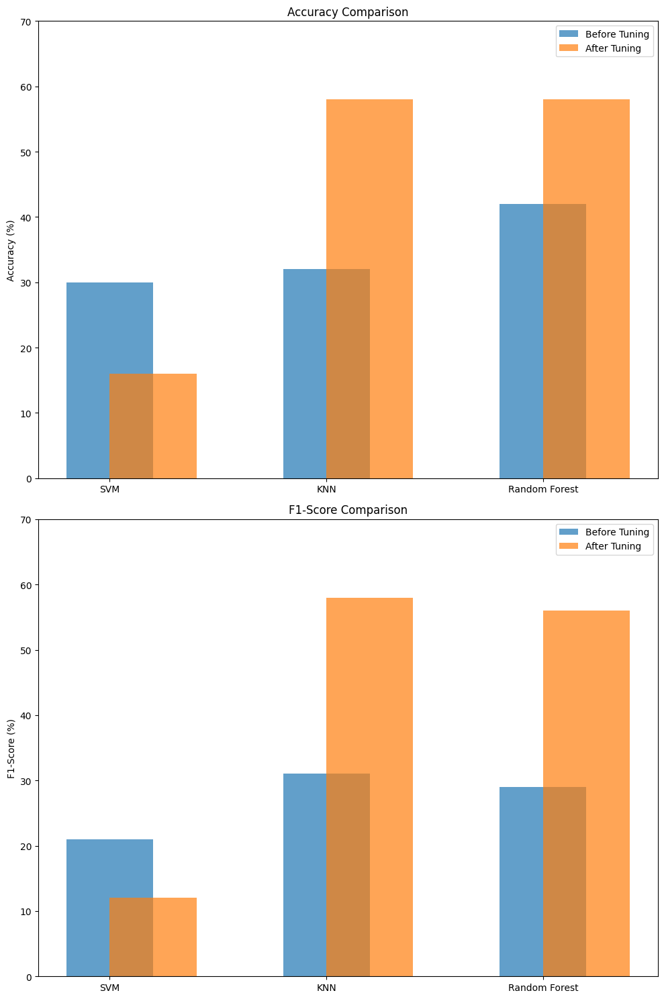

In [ ]:
# Data
models = ['SVM', 'KNN', 'Random Forest']
accuracy_before = [30, 32, 42]
accuracy_after = [16, 58, 58]
f1_before = [21, 31, 29]
f1_after = [12, 58, 56]

# Setting up the figure and axis
fig, ax = plt.subplots(2, 1, figsize=(10, 15))

# Plotting accuracy
ax[0].bar(models, accuracy_before, width=0.4, align='center', label='Before Tuning', alpha=0.7)
ax[0].bar(models, accuracy_after, width=0.4, align='edge', label='After Tuning', alpha=0.7)
ax[0].set_title("Accuracy Comparison")
ax[0].set_ylabel("Accuracy (%)")
ax[0].legend()
ax[0].set_ylim(0, 70)  # Assuming accuracy is in percentage. Adjust this value if needed

# Plotting F1-score
ax[1].bar(models, f1_before, width=0.4, align='center', label='Before Tuning', alpha=0.7)
ax[1].bar(models, f1_after, width=0.4, align='edge', label='After Tuning', alpha=0.7)
ax[1].set_title("F1-Score Comparison")
ax[1].set_ylabel("F1-Score (%)")
ax[1].legend()
ax[1].set_ylim(0, 70)  # Assuming F1-score is in percentage. Adjust this value if needed

plt.tight_layout()
plt.show()

**SVM (Support Vector Machine)**

* **Before tuning:** The accuracy is low at 30%. The f1-scores for the classes are also relatively low, with a weighted average f1-score of 29%.
* **After tuning:** The accuracy increases significantly to 58%, and the weighted average f1-score also improves considerably to 58%.

**KNN (K-Nearest Neighbors)**

* **Before tuning:** The accuracy is slightly higher than SVM's initial performance at 32%. The weighted average f1-score is 31%, which is a little higher than SVM before tuning.
* **After tuning:** The accuracy again sees a significant increase to 58%, and the weighted average f1-score matches the accuracy at 58%.

**Random Forest**

* **Before tuning:** The accuracy for Random Forest before tuning is the highest among the three models at 42%. The f1-scores for the classes vary, with the weighted average f1-score at 39%. However, the macro average f1-score is only 29%, indicating disparities in the f1-scores across classes.
* **After tuning:** The accuracy remains consistent with the tuned SVM and KNN at 58%. The weighted average f1-score is 56%, which is a notable improvement from before tuning but slightly lower than SVM and KNN after tuning.

**Key Observations:**

1. **Model Improvement After Tuning:**
All three models demonstrated substantial improvement after tuning. This highlights the importance of hyperparameter tuning and using balanced data when training machine learning models.

2. **Consistency After Tuning:**
After the tuning process, all three models converged to similar accuracy and f1-scores. This indicates that the three models, when appropriately optimized, can offer comparable performance on this dataset.

3. **Random Forest's Initial Superiority:**
Before any tuning, Random Forest had the best initial performance among the three. This suggests that ensemble methods like Random Forest can naturally handle the complexity of certain datasets better than simpler models. However, with optimization, simpler models like SVM and KNN can catch up.

4. **Class Imbalance:**
The results show a clear disparity in the precision, recall, and f1-scores across different classes. This indicates class imbalance in the dataset, which can affect the performance of models. It's crucial to handle this imbalance, possibly using techniques like over-sampling, under-sampling, or the Synthetic Minority Over-sampling Technique (SMOTE).

5. **SelectKBest:**
The feature selection process seems to have been effective. Using SelectKBest likely streamlined the feature space, eliminating irrelevant or redundant features, and helped in enhancing model performance, especially after tuning.

**Recommendations:**

Model Selection: Given that all models have similar performance after tuning, model selection can be based on other factors such as interpretability, deployment considerations, and computational resources. If interpretability is essential, Random Forest might be a preferred choice due to its ability to rank feature importance.

**Further Exploration:**

As initially observed the data is imbalanced between the genders, balancing the genders and exploring other features could help.

##### 3.3.2.4a Since the results were so poor we need to go back to the drawing board. Balance by gender, update the age-gender grouping, then change the feature selection and try again.

###### 3.3.2.4.1 Update Age-gender (group, and group_id) to create better balance

In [ ]:
# Creating age groups based on the age column.
def new_age_group(age):
    if age < 26:
        return '25-'
    elif 26 <= age < 30:
        return '26+'
    elif 30 <= age < 35:
        return '30+'
    elif 35 <= age < 42:
        return '35+'
    else:
        return '42+'

In [ ]:
# Applying the function to create a new age group column
talking_data_df['age_group'] = talking_data_df['age'].apply(new_age_group)
label_encoder = LabelEncoder()
talking_data_df['age_group_id'] = label_encoder.fit_transform(talking_data_df['age_group'])
# Create 'group' field by concatenating 'gender' and 'age_group'
talking_data_df['group'] = talking_data_df['gender'] + talking_data_df['age_group'].astype(str)
talking_data_df['group_id'] = label_encoder.fit_transform(talking_data_df['group'])



In [ ]:
# Applying the function to create a new age group column
full_talking_data_df['age_group'] = full_talking_data_df['age'].apply(new_age_group)
label_encoder = LabelEncoder()
full_talking_data_df['age_group_id'] = label_encoder.fit_transform(full_talking_data_df['age_group'])
# Create 'group' field by concatenating 'gender' and 'age_group'
full_talking_data_df['group'] = full_talking_data_df['gender'] + full_talking_data_df['age_group'].astype(str)
full_talking_data_df['group_id'] = label_encoder.fit_transform(full_talking_data_df['group'])

###### 3.3.2.4.1a Store the updated gender-groups

In [ ]:
talking_data_df.to_csv(f'{capstone_dir}/talking_data_mobile_user.csv', index=False)

In [ ]:
full_talking_data_df.to_csv(f'{capstone_dir}/full_talking_data_mobile_user.csv', index=False)

###### 3.3.2.4.2 Upsample the female data since it is significantly lower than the male.

In [ ]:
# Separate majority and minority classes
df_majority = talking_data_df[talking_data_df.is_male==1]
df_minority = talking_data_df[talking_data_df.is_male==0]

# Upsample minority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority),    # to match majority class
                                 random_state=42)  # reproducible results

# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

# Display new class counts
df_upsampled.is_male.value_counts()

1    85639
0    85639
Name: is_male, dtype: int64

In [ ]:
talking_data_df.is_male.value_counts()

1    85639
0    34684
Name: is_male, dtype: int64

In [ ]:
unbalanced_talking_data_df = talking_data_df
talking_data_df = df_upsampled

In [ ]:
full_talking_data_df.is_male.value_counts()

1    855558
0    347673
Name: is_male, dtype: int64

In [ ]:
# Separate majority and minority classes
full_df_majority = full_talking_data_df[full_talking_data_df.is_male==1]
full_df_minority = full_talking_data_df[full_talking_data_df.is_male==0]

# Upsample minority class
full_df_minority_upsampled = resample(full_df_minority,
                                 replace=True,     # sample with replacement
                                 n_samples=len(full_df_majority),    # to match majority class
                                 random_state=42)  # reproducible results

# Combine majority class with upsampled minority class
full_df_upsampled = pd.concat([full_df_majority, full_df_minority_upsampled])

# Display new class counts
full_df_upsampled.is_male.value_counts()

1    855558
0    855558
Name: is_male, dtype: int64

In [ ]:
full_talking_data_df = full_df_upsampled

###### 3.3.2.4.3 Visualize data balance

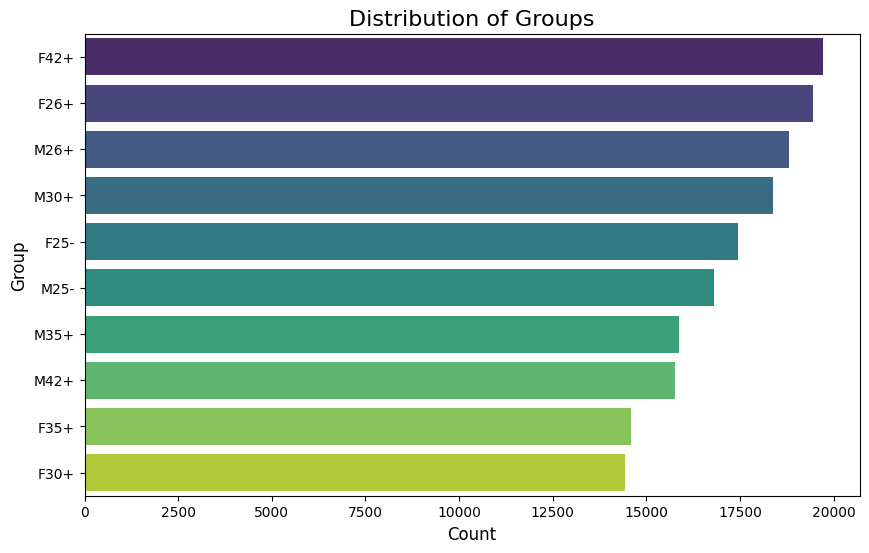

In [ ]:
# Visualize Changes before saving to csv
group_counts = talking_data_df['group'].value_counts().reset_index()
group_counts.columns = ['group', 'count']

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='group', data=group_counts, palette='viridis')

# Add title and labels
plt.title('Distribution of Groups', fontsize=16)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Group', fontsize=12)

# Show plot
plt.show()


###### 3.3.2.4.4 Store the balanced data for future runs

In [ ]:
talking_data_df.to_csv(f'{capstone_dir}/talking_data_mobile_user_balanced.csv', index=False)

In [ ]:
full_talking_data_df.to_csv(f'{capstone_dir}/full_talking_data_mobile_user_balanced.csv', index=False)

##### 3.3.2.4.5 Read rebalanced data from file each time I come back for faster continuation

In [ ]:
# From here, since the clean dataset is already balanced.
# Since Data is already created, start from here going forward
# Load the dataset and conduct any necessary preprocessing

drive.mount('/content/drive')

unbalanced_full_talking_data_df = pd.read_csv(f'{capstone_dir}/full_talking_data_mobile_user.csv')
unbalanced_talking_data_df = pd.read_csv(f'{capstone_dir}/talking_data_mobile_user.csv')
full_talking_data_df = pd.read_csv(f'{capstone_dir}/full_talking_data_mobile_user_balanced.csv')
talking_data_df = pd.read_csv(f'{capstone_dir}/talking_data_mobile_user_balanced.csv')
print(f"The shape of the full talking data is: {full_talking_data_df.shape} and unbalanced data: {unbalanced_talking_data_df.shape}")

print('--------- unbalanced_full_talking_data_df.info ---------')
unbalanced_full_talking_data_df.info()
print('--------- full_talking_data_df.info ---------')
full_talking_data_df.info()
print('--------- unbalanced_talking_data_df.info ---------')
unbalanced_talking_data_df.info()
print('--------- -------- ---------')

print(f"The shape of the talking data is: {talking_data_df.shape}")
talking_data_df.info()
talking_data_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
The shape of the full talking data is: (1711116, 18) and unbalanced data: (120323, 18)
--------- unbalanced_full_talking_data_df.info ---------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1203231 entries, 0 to 1203230
Data columns (total 18 columns):
 #   Column           Non-Null Count    Dtype 
---  ------           --------------    ----- 
 0   device_id        1203231 non-null  int64 
 1   gender           1203231 non-null  object
 2   age              1203231 non-null  int64 
 3   age_group        1203231 non-null  object
 4   phone_brand      1203231 non-null  object
 5   device_model     1203231 non-null  object
 6   day              1203231 non-null  int64 
 7   is_male          1203231 non-null  int64 
 8   phone_brand_id   1203231 non-null  int64 
 9   device_model_id  1203231 non-null  int64 
 10  age_group_id     1203231 non-null  int64 
 11

,device_id,gender,age,age_group,phone_brand,device_model,day,is_male,phone_brand_id,device_model_id,age_group_id,year,month,hour,minute,second,group,group_id
0,-890951709,M,35,35+,OPPO,R7,4,1,4,517,3,2016,5,14,37,48,M35+,8
1,521344772,M,49,42+,vivo,S11T,1,1,8,539,4,2016,5,13,11,59,M42+,9
2,-132116321,M,52,42+,努比亚,Z7 Max,5,1,20,780,4,2016,5,19,4,53,M42+,9
3,-1986166094,M,31,30+,HTC,One A9,5,1,1,460,2,2016,5,20,50,28,M30+,7
4,-1479470945,M,39,35+,小米,MI 4,1,1,34,407,3,2016,5,2,46,23,M35+,8


In [ ]:
unbalanced_talking_data_df.head()

,device_id,gender,age,age_group,phone_brand,device_model,day,is_male,phone_brand_id,device_model_id,age_group_id,year,month,hour,minute,second,group,group_id
0,-1127415461,F,25,25-,魅族,MX2,7,0,87,416,0,2016,5,9,33,48,F25-,0
1,-2144834217,F,32,30+,魅族,MX4,1,0,87,418,2,2016,5,10,27,25,F30+,2
2,-576592613,F,23,25-,OPPO,R7,1,0,4,517,0,2016,5,22,39,17,F25-,0
3,-329836638,F,39,35+,vivo,X5Max+,2,0,8,684,3,2016,5,18,30,34,F35+,3
4,-890951709,M,35,35+,OPPO,R7,4,1,4,517,3,2016,5,14,37,48,M35+,8


###### 3.3.2.4.6 Reselect features then run Supervised learning models again

In [ ]:
research_features = ['device_id', 'group_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
research_data = talking_data_df[research_features]
selected_features = ['device_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']


##### 3.3.2.5 Re-split data


In [ ]:
#Create a new DataFrame X with just selected features
X = talking_data_df[selected_features]

# create target variable
y = talking_data_df['group_id']

#Split the data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.42, random_state=42)

In [ ]:
# Feature Selection
X_new = selector.fit_transform(X_train, y_train)

# Print the scores for each feature
for i, score in enumerate(selector.scores_):
    print(f"Feature {X_train.columns[i]}: {score}")

Feature device_id: 79.37798090788442
Feature day: 3.611097238615927
Feature hour: 13.117683488688748
Feature phone_brand_id: 91.43347839050287
Feature device_model_id: 33.80696925399008


In [ ]:
X_new.shape

(99341, 5)

###### 3.3.2.5.1 Re-run SelectKBest & Random Forest

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [50, 100, 200],
      'max_depth': [None, 10, 20, 30],
      'min_samples_split': [2, 5, 10]
    },
    cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for RandomForest: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for RandomForest:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for RandomForest:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for RandomForest:")
    print(cross_val_score(RandomForestClassifier(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model RandomForest: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      7388
           1       0.89      0.95      0.92      8139
           2       0.89      0.94      0.92      5987
           3       0.91      0.94      0.92      6111
           4       0.90      0.96      0.93      8366
           5       0.80      0.74      0.77      7158
           6       0.81      0.76      0.78      7884
           7       0.80      0.76      0.78      7735
           8       0.81      0.78      0.79      6554
           9       0.81      0.77      0.79      6615

    accuracy                           0.85     71937
   macro avg       0.85      0.85      0.85     71937
weighted avg       0.85      0.85      0.85     71937

Confusion Matrix for RandomForest:
[[6968   27   23   18   35   83   98   55   54   27]
 [  54 7734  

###### 3.3.2.5.2 Re-run SelectKBest & KNN

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [7],
        'weights': ['distance']
    }, cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for KNN: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for KNN:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      7388
           1       0.97      0.99      0.98      8139
           2       0.97      0.98      0.98      5987
           3       0.98      0.99      0.98      6111
           4       0.98      0.99      0.98      8366
           5       0.96      0.94      0.95      7158
           6       0.97      0.95      0.96      7884
           7       0.96      0.95      0.96      7735
           8       0.96      0.96      0.96      6554
           9       0.96      0.96      0.96      6615

    accuracy                           0.97     71937
   macro avg       0.97      0.97      0.97     71937
weighted avg       0.97      0.97      0.97     71937

Confusion Matrix for KNN:
[[7250    8    6    4   16   29   23   28   13   11]
 [  11 8025    7    2   10   21   10   16   17   20]
 [  14   2

###### 3.3.2.5.3 Re-run SelectKBest & SVM

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [10],
      'kernel': ['rbf']
    }, cv=5, n_jobs=-1)
    grid.fit(X_new, y_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for SVM:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.17      0.09      0.12      7388
           1       0.13      0.37      0.19      8139
           2       0.00      0.00      0.00      5987
           3       0.00      0.00      0.00      6111
           4       0.13      0.50      0.21      8366
           5       0.00      0.00      0.00      7158
           6       0.12      0.20      0.15      7884
           7       0.07      0.00      0.00      7735
           8       0.00      0.00      0.00      6554
           9       0.00      0.00      0.00      6615

    accuracy                           0.13     71937
   macro avg       0.06      0.12      0.07     71937
weighted avg       0.07      0.13      0.08     71937

Confusion Matrix for SVM:
[[ 672 2236    0    0 2841    0 1634    5    0    0]
 [ 397 2981    0    0 3461    0 1236   64    0    0]
 [ 278 1755    0    0 306

###### 3.3.2.5.4 Scale X then Re-run SelectKBest & SVM

In [ ]:
# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Feature Selection
X_new_scaled = selector.fit_transform(X_train_scaled, y_train)


In [ ]:
X_new_scaled.shape

(99341, 5)

In [ ]:
try:
    # Starting a timer
    start_time = time.time()

    grid = GridSearchCV(SVC(),
    {
      'C': [10],
      'kernel': ['rbf'],  # Remove 'linear' to speed up the process
    },
    cv=StratifiedKFold(n_splits=3),  # Reduce number of splits for cross-validation
    n_jobs=-1)

    grid.fit(X_new_scaled, y_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test_scaled))
    print(f"\nClassification Report for SVM on X_new_scaled:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), selector.transform(X_test_scaled), y_test, cv=3))

except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")

finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for SVM on X_new_scaled:
              precision    recall  f1-score   support

           0       0.24      0.34      0.28      7388
           1       0.24      0.24      0.24      8139
           2       0.22      0.10      0.14      5987
           3       0.22      0.23      0.23      6111
           4       0.21      0.42      0.28      8366
           5       0.21      0.15      0.18      7158
           6       0.21      0.14      0.17      7884
           7       0.17      0.20      0.18      7735
           8       0.19      0.12      0.15      6554
           9       0.25      0.13      0.17      6615

    accuracy                           0.21     71937
   macro avg       0.22      0.21      0.20     71937
weighted avg       0.22      0.21      0.20     71937

Confusion Matrix for SVM:
[[2534  849  197  466 1102  488  517  767  268  200]
 [1308 1923  247  519 1512  550  478  971  447  184]
 [ 840  6

In [ ]:
# Scale the data (important for SVM)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into a subset (using stratified sampling to maintain class distribution)
X_subset, _, y_subset, _ = train_test_split(X_scaled, y, test_size=0.3, stratify=y, random_state=42)

# Split the subset into training and testing sets
SVM_X_train, SVM_X_test, SVM_y_train, SVM_y_test = train_test_split(X_subset, y_subset, test_size=0.2, random_state=42)

# Feature selection using SelectKBest
SVM_X_new = selector.fit_transform(SVM_X_train, SVM_y_train)

In [ ]:
SVM_X_new.shape

(95915, 5)

In [ ]:
try:
    # Starting a timer
    start_time = time.time()

    grid = GridSearchCV(SVC(),
    {
      'C': [10],
      'kernel': ['rbf'],  # Remove 'linear' to speed up the process
    },
    cv=StratifiedKFold(n_splits=3),  # Reduce number of splits for cross-validation
    n_jobs=-1)

    grid.fit(SVM_X_new, SVM_y_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    SVM_y_pred = grid.predict(selector.transform(SVM_X_test))
    print(f"\nClassification Report for SVM:\n{classification_report(SVM_y_test, SVM_y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(SVM_y_test, SVM_y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), selector.transform(SVM_X_test), SVM_y_test, cv=3))

except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")

finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.25      0.38      0.30      2427
           1       0.25      0.24      0.25      2777
           2       0.24      0.10      0.14      2004
           3       0.23      0.23      0.23      2028
           4       0.21      0.41      0.28      2821
           5       0.21      0.15      0.18      2359
           6       0.21      0.16      0.18      2536
           7       0.17      0.22      0.19      2576
           8       0.18      0.11      0.14      2205
           9       0.26      0.13      0.18      2246

    accuracy                           0.22     23979
   macro avg       0.22      0.21      0.20     23979
weighted avg       0.22      0.22      0.21     23979

Confusion Matrix for SVM:
[[ 916  232   53  122  347  177  153  261   98   68]
 [ 416  662   84  169  473  200  190  375  133   75]
 [ 310  228  191  180  42

In [ ]:
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)
y_train_balanced.value_counts()
# Using only 40% of the balanced data
Xtuned_train, X_discard, ytuned_train, y_discard = train_test_split(
    X_train_balanced,
    y_train_balanced,
    test_size=0.6,  # Discarding 60%
    random_state=42,
    stratify=y_train_balanced
)
# Using only 40% of the X_discard data
_, Xtuned_test, _, ytuned_test = train_test_split(
    X_discard,
    y_discard,
    test_size=0.4,
    random_state=42,
    stratify=y_discard
)

In [ ]:
Xtuned_train.shape
Xtuned_train.info()
Xtuned_test.shape
Xtuned_test.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 45372 entries, 12400 to 9033
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   device_id        45372 non-null  int64
 1   day              45372 non-null  int64
 2   hour             45372 non-null  int64
 3   phone_brand_id   45372 non-null  int64
 4   device_model_id  45372 non-null  int64
dtypes: int64(5)
memory usage: 2.1 MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 27224 entries, 10081 to 40175
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   device_id        27224 non-null  int64
 1   day              27224 non-null  int64
 2   hour             27224 non-null  int64
 3   phone_brand_id   27224 non-null  int64
 4   device_model_id  27224 non-null  int64
dtypes: int64(5)
memory usage: 1.2 MB


In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [10],
      'kernel': ['rbf']
    }, cv=5, n_jobs=-1)
    grid.fit(Xtuned_train, ytuned_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test))
    print(f"\nClassification Report for SVM:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), Xtuned_test, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.14      0.33      0.19      2722
           1       0.09      0.04      0.06      2722
           2       0.13      0.11      0.12      2722
           3       0.00      0.00      0.00      2723
           4       0.12      0.37      0.19      2723
           5       0.12      0.20      0.15      2723
           6       0.00      0.00      0.00      2722
           7       0.00      0.00      0.00      2723
           8       0.12      0.20      0.15      2722
           9       0.00      0.00      0.00      2722

    accuracy                           0.13     27224
   macro avg       0.07      0.13      0.09     27224
weighted avg       0.07      0.13      0.09     27224

Confusion Matrix for SVM:
[[ 902   65  259    0  692  417    0    0  387    0]
 [ 617  107  196    0  833  551    0    0  418    0]
 [ 574  137  300    0  88

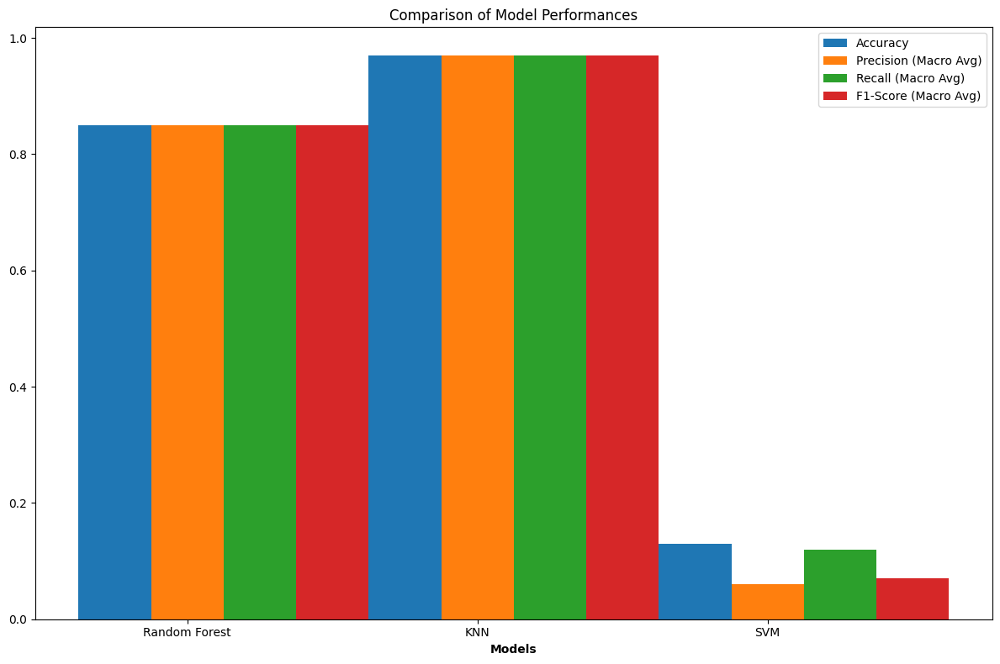

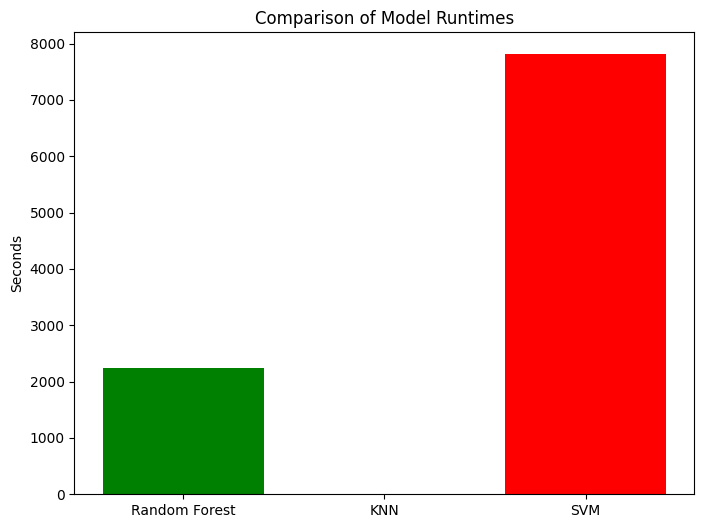

In [ ]:
# Define the model names and their scores
models = ['Random Forest', 'KNN', 'SVM']
accuracy = [0.85, 0.97, 0.13]
precision = [0.85, 0.97, 0.06]
recall = [0.85, 0.97, 0.12]
f1_score = [0.85, 0.97, 0.07]
runtime = [2249.88, 10.65, 7810.23]

# Create bar charts
barWidth = 0.25
r1 = np.arange(len(models))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]

plt.figure(figsize=(12, 8))

# Create bars
plt.bar(r1, accuracy, width=barWidth, label='Accuracy')
plt.bar(r2, precision, width=barWidth, label='Precision (Macro Avg)')
plt.bar(r3, recall, width=barWidth, label='Recall (Macro Avg)')
plt.bar(r4, f1_score, width=barWidth, label='F1-Score (Macro Avg)')

# Title & subtitle
plt.title('Comparison of Model Performances')
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(models))], models)

# Add legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

# Now, let's create a bar chart for runtime
plt.figure(figsize=(8, 6))
plt.bar(models, runtime, color=['green', 'blue', 'red'])
plt.title('Comparison of Model Runtimes')
plt.ylabel('Seconds')
plt.show()

##### 3.3.2.6
##### Random Forest
###### Advantages:

Relatively high accuracy of 85%.
Consistent cross-validation scores around 76% indicating the model isn't overfitting significantly.
Given the importance of device_id, day, hour, phone_brand_id, and device_model_id, a Random Forest can capture intricate patterns and non-linearities among these variables.
###### Limitations:

The runtime is quite long at approximately 2250 seconds.
Some classes like 5, 6, 7, 8, and 9 have relatively lower precision and recall than the other classes, indicating possible imbalances in class distribution even after upsampling or that the features are not as discriminative for these classes.
##### k-Nearest Neighbors (kNN)
###### Advantages:

Exceptionally high accuracy of 97%, which is impressive.
The confusion matrix indicates a very high true positive rate for almost every class, with very few misclassifications.
Significantly faster than Random Forest with a runtime of about 11 seconds.
###### Limitations:

kNN can be sensitive to noise in the data or irrelevant features. Given the high performance, it seems that the feature engineering has led to clean, relevant features for the model.
kNN models can be slow for predictions in real-time scenarios due to the need to compute distances to all training samples. However, given the fast runtime, this might not be a significant concern in this case.
##### Support Vector Machine (SVM)
###### Advantages:

SVMs are powerful classifiers that can capture high-dimensional patterns.
###### Limitations:

Extremely poor performance with an accuracy of just 13%. The confusion matrix and the classification report both show that the SVM model struggles to classify most of the classes correctly.
SVM took the longest time at approximately 7810 seconds, making it both time-consuming and ineffective for this dataset.
The rbf kernel may have led to overfitting, given the many dimensions in my data.
##### Recommendations:
* kNN is the Winner: Based on accuracy, precision, recall, and F1-score, the kNN classifier clearly outperforms the other models. If prediction time isn't a major concern, it's recommended to use the kNN classifier with the best parameters you've found (n_neighbors: 7, weights: 'distance').

* Potential Overfitting with kNN: Despite its performance on the validation set, ensure that kNN isn't overfitting the training data. It's always a good practice to keep a separate test set to evaluate the model's performance before deploying.

* Random Forest Tuning: If you still want to pursue Random Forest (due to its interpretability or any other reason), consider further hyperparameter tuning, exploring feature importance, and possibly engineering more features or removing ones that don't provide much discriminatory power.

* Avoid SVM for This Dataset: Given its poor performance and long runtime, it might not be worth pursuing SVM further for this particular problem and dataset.

* Consider Deep Learning: Given more computational resources and if dealing with a huge amount of data, consider trying deep learning models like neural networks. They can potentially capture even more intricate patterns in the data, especially if there are hidden relationships that simple models can't capture.

* Evaluate on Test Set: Finally, once I finalized a model, I'll evaluate it on a separate test set to get an unbiased estimate of its performance.



In [ ]:
from sklearn.metrics import accuracy_score
grid = GridSearchCV(KNeighborsClassifier(), {
    'n_neighbors': [7],
    'weights': ['distance']
}, cv=5, n_jobs=-1)

grid.fit(X_new, y_train)

# Predict on training data
train_predictions = grid.predict(X_train)

train_accuracy = accuracy_score(y_train, train_predictions)

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Validation Accuracy: {0.97}")  # Your previous kNN validation accuracy

# If the training accuracy is very close to 1 and there's a significant drop in validation accuracy, be cautious of overfitting.

Training Accuracy: 1.0000
Validation Accuracy: 0.97


#### 3.3.3 Stratified y_train (Intentionally named to come after PCA)
After working on PCA I realized that the y_train is imbalanced, it didn't maiantain the balanced data. Could there be overfitting in the above results?
I will try stratified y so as to maintain the same class distribution in both training and test sets.

In [ ]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.3, stratify=y)

In [ ]:
X_train1.shape

(119894, 5)

In [ ]:
y_train.value_counts()

4    11343
1    11322
6    10918
7    10636
0    10055
5     9657
8     9317
9     9165
3     8493
2     8435
Name: group_id, dtype: int64

In [ ]:
y_train1.value_counts()

4    13796
1    13623
6    13161
7    12860
0    12210
5    11770
8    11110
9    11046
3    10223
2    10095
Name: group_id, dtype: int64

In [ ]:
# Feature Selection
X_new1 = selector.fit_transform(X_train1, y_train1)

# Print the scores for each feature
for i, score in enumerate(selector.scores_):
    print(f"Feature {X_train1.columns[i]}: {score}")

Feature device_id: 82.22978256098847
Feature day: 2.311499997638915
Feature hour: 12.62907948601578
Feature phone_brand_id: 105.503266367667
Feature device_model_id: 37.544493789575384


####3.3.4 Re-split with stratified y_train to shape: (119894, 5)
SelectKBest and all 3 models

In [ ]:
# Initialize models
models = {
    "RandomForest": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC()
}

params = {
    'RandomForest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'KNN': {
        'n_neighbors': [7],
        'weights': ['distance']
    },
    'SVM': {
        'C': [10],
        'kernel': ['rbf']
    }
}


In [ ]:
# Use GridSearch on the re-sampled subset data for all 3 models
for name, model in models.items():
    try:
        # Starting a timer
        start_time = time.time()
        grid = GridSearchCV(model, params[name],
        cv=StratifiedKFold(n_splits=3),  # Reduce number of splits for cross-validation
        n_jobs=-1)
        grid.fit(X_new1, y_train1)
        print(f"Best parameters for {name} - SelectKBest: {grid.best_params_}")

        # 3. Evaluation
        y_pred = grid.predict(selector.transform(X_test1))
        print(f"\nClassification Report for {name} - SelectKBest:\n{classification_report(y_test1, y_pred)}")
        print(f"Confusion Matrix for {name}:\n{confusion_matrix(y_test1, y_pred)}\n\n")
        print(f"Cross-validation scores for {name}:")
        print(cross_val_score(model, X_test1, y_test1, cv=3))
    except Exception as e:
        print(f"An error occurred while processing model {name}: {e}")
    finally:
        # Printing the total runtime
        end_time = time.time()
        print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for RandomForest - SelectKBest: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}

Classification Report for RandomForest - SelectKBest:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      5233
           1       0.91      0.96      0.93      5838
           2       0.91      0.96      0.93      4327
           3       0.92      0.96      0.94      4381
           4       0.92      0.97      0.94      5913
           5       0.82      0.77      0.80      5045
           6       0.84      0.79      0.81      5641
           7       0.83      0.80      0.81      5511
           8       0.85      0.80      0.83      4761
           9       0.84      0.80      0.82      4734

    accuracy                           0.88     51384
   macro avg       0.87      0.88      0.88     51384
weighted avg       0.87      0.88      0.88     51384

Confusion Matrix for RandomForest:
[[5053   17   15   15    4   33   36   3

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [10],
      'kernel': ['rbf']
    }, cv=5, n_jobs=-1)
    grid.fit(X_new1, y_train1)

    # Evaluation
    y_pred1 = grid.predict(selector.transform(X_test1))
    print(f"\nClassification Report for SVM and SelectKBest with stratified y:\n{classification_report(y_test1, y_pred1)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(y_test1, y_pred1)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), X_test1, y_test1, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")


Classification Report for SVM and SelectKBest with stratified y:
              precision    recall  f1-score   support

           0       0.14      0.32      0.20      5233
           1       0.12      0.36      0.18      5838
           2       0.00      0.00      0.00      4327
           3       0.00      0.00      0.00      4381
           4       0.13      0.52      0.21      5913
           5       0.00      0.00      0.00      5045
           6       0.00      0.00      0.00      5641
           7       0.00      0.00      0.00      5511
           8       0.00      0.00      0.00      4761
           9       0.00      0.00      0.00      4734

    accuracy                           0.13     51384
   macro avg       0.04      0.12      0.06     51384
weighted avg       0.04      0.13      0.07     51384

Confusion Matrix for SVM:
[[1700 1573    0    0 1960    0    0    0    0    0]
 [1165 2077    0    0 2596    0    0    0    0    0]
 [ 782 1316    0    0 2229    0    0    0  

### 3.4 PCA

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99341 entries, 135777 to 121958
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   device_id        99341 non-null  int64
 1   day              99341 non-null  int64
 2   hour             99341 non-null  int64
 3   phone_brand_id   99341 non-null  int64
 4   device_model_id  99341 non-null  int64
dtypes: int64(5)
memory usage: 4.5 MB


In [ ]:
talking_data_df['group'].value_counts()

F42+    19709
F26+    19461
M26+    18802
M30+    18371
F25-    17443
M25-    16815
M35+    15871
M42+    15780
F35+    14604
F30+    14422
Name: group, dtype: int64

In [ ]:
y_train.value_counts()

4    11343
1    11322
6    10918
7    10636
0    10055
5     9657
8     9317
9     9165
3     8493
2     8435
Name: group_id, dtype: int64

In [ ]:
y.value_counts()

4    19709
1    19461
6    18802
7    18371
0    17443
5    16815
8    15871
9    15780
3    14604
2    14422
Name: group_id, dtype: int64

In [ ]:
# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Feature Selection
X_new_scaled = selector.fit_transform(X_train_scaled, y_train)

In [ ]:
# Apply PCA to Standardized and scaled data
pca = PCA(n_components=5)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [ ]:
X_train_pca.shape

(99341, 5)

In [ ]:
# Standardize the data
X_train_scaled1 = scaler.fit_transform(X_train1)
X_test_scaled1 = scaler.transform(X_test1)

# Feature Selection
X_new_scaled1 = selector.fit_transform(X_train_scaled1, y_train1)

In [ ]:
# Apply PCA to Standardized and scaled data
X_train_pca1 = pca.fit_transform(X_train_scaled1)
X_test_pca1 = pca.transform(X_test_scaled1)

#### 3.4.1 RandomForest & PCA

In [ ]:
try:
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [50, 100, 200],
      'max_depth': [None, 10, 20, 30],
      'min_samples_split': [2, 5, 10]
    },
    cv=5, n_jobs=-1)

    grid.fit(X_train_pca, y_train)
    print(f"Best parameters for RandomForest: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test_pca))
    print(f"\nClassification Report for PCA & RandomForest:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for RandomForest:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for RandomForest:")
    print(cross_val_score(RandomForestClassifier(), X_test_pca, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model RandomForest: {e}")

Best parameters for RandomForest: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 100}

Classification Report for PCA & RandomForest:
              precision    recall  f1-score   support

           0       0.79      0.87      0.83      7388
           1       0.79      0.89      0.84      8139
           2       0.80      0.86      0.83      5987
           3       0.81      0.88      0.84      6111
           4       0.80      0.90      0.85      8366
           5       0.58      0.51      0.54      7158
           6       0.58      0.52      0.55      7884
           7       0.57      0.52      0.55      7735
           8       0.59      0.53      0.56      6554
           9       0.59      0.52      0.56      6615

    accuracy                           0.70     71937
   macro avg       0.69      0.70      0.69     71937
weighted avg       0.69      0.70      0.69     71937

Confusion Matrix for RandomForest:
[[6436   94   49   54   73  180  197  123   82  100]
 [ 105 72

#### 3.4.2 SVM & PCA

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [0.1, 1, 10],
      'kernel': ['rbf']
    },
    cv=StratifiedKFold(n_splits=3),  # Reduce number of splits for cross-validation
    n_jobs=-1)
    grid.fit(X_train_pca, y_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test_pca))
    print(f"\nClassification Report for PCA & SVM:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), X_test_pca, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total start_time: {start_time}")
    print(f"Total end_time: {end_time}")
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for PCA & SVM:
              precision    recall  f1-score   support

           0       0.24      0.34      0.28      7388
           1       0.24      0.24      0.24      8139
           2       0.22      0.10      0.14      5987
           3       0.22      0.23      0.23      6111
           4       0.21      0.42      0.28      8366
           5       0.21      0.15      0.18      7158
           6       0.21      0.14      0.17      7884
           7       0.17      0.20      0.18      7735
           8       0.19      0.12      0.15      6554
           9       0.25      0.13      0.17      6615

    accuracy                           0.21     71937
   macro avg       0.22      0.21      0.20     71937
weighted avg       0.22      0.21      0.20     71937

Confusion Matrix for SVM:
[[2534  849  197  466 1102  488  517  767  268  200]
 [1308 1923  247  519 1512  550  478  971  447  184]
 [ 840  644  621  5

#### 3.4.3 KNN & PCA

In [ ]:
try:
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance']
    }, cv=5, n_jobs=-1)

    grid.fit(X_train_pca, y_train)
    print(f"Best parameters for KNN: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test_pca))
    print(f"\nClassification Report for KNN:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), X_test_pca, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")

Best parameters for KNN: {'n_neighbors': 3, 'weights': 'distance'}

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.74      0.86      0.79      7388
           1       0.74      0.88      0.80      8139
           2       0.72      0.85      0.78      5987
           3       0.74      0.87      0.80      6111
           4       0.75      0.89      0.81      8366
           5       0.55      0.44      0.49      7158
           6       0.55      0.44      0.49      7884
           7       0.54      0.45      0.49      7735
           8       0.54      0.46      0.49      6554
           9       0.54      0.45      0.49      6615

    accuracy                           0.66     71937
   macro avg       0.64      0.66      0.64     71937
weighted avg       0.64      0.66      0.65     71937

Confusion Matrix for KNN:
[[6324  107   98   79   96  147  187  137  103  110]
 [ 137 7144   90   56  102  125  142  137   98  108]
 [  75   9

#### 3.4.4 Apply PCA to tuned data

In [ ]:
# Standardize the data
scaler = StandardScaler()
Xtuned_train_scaled = scaler.fit_transform(Xtuned_train)
Xtuned_test_scaled = scaler.transform(Xtuned_test)

# Apply PCA
pca = PCA(n_components=5)
Xtuned_train_pca = pca.fit_transform(Xtuned_train_scaled)
Xtuned_test_pca = pca.transform(Xtuned_test_scaled)

In [ ]:
#Best parameters for RandomForest: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}
try:
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [200],
      'max_depth': [30],
      'min_samples_split': [2]
    },
    cv=5, n_jobs=-1)

    grid.fit(Xtuned_train_pca, ytuned_train)
    print(f"Best parameters for RandomForest: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test_pca))
    print(f"\nClassification Report for RandomForest:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for RandomForest:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for RandomForest:")
    print(cross_val_score(RandomForestClassifier(), Xtuned_test_pca, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model RandomForest: {e}")

Best parameters for RandomForest: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}

Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.61      0.69      0.64      2722
           1       0.60      0.66      0.63      2722
           2       0.63      0.69      0.66      2722
           3       0.66      0.72      0.69      2723
           4       0.63      0.69      0.66      2723
           5       0.41      0.38      0.39      2723
           6       0.40      0.34      0.37      2722
           7       0.38      0.34      0.36      2723
           8       0.42      0.38      0.40      2722
           9       0.45      0.44      0.44      2722

    accuracy                           0.53     27224
   macro avg       0.52      0.53      0.52     27224
weighted avg       0.52      0.53      0.52     27224

Confusion Matrix for RandomForest:
[[1869  115   69   70   83  139  109  105   86   77]
 [ 124 1785   9

##### SVM & PCA to Best parameters, tuned data


In [ ]:
#Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(SVC(), {
      'C': [10],
      'kernel': ['rbf']
    },
    cv=StratifiedKFold(n_splits=3),  # Reduce number of splits for cross-validation
    n_jobs=-1)
    grid.fit(Xtuned_train_pca, ytuned_train)
    print(f"Best parameters for SVM: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test_pca))
    print(f"\nClassification Report for PCA & SVM using Best parameters, tuned and balanced data:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for SVM:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for SVM:")
    print(cross_val_score(SVC(), Xtuned_test_pca, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model SVM: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"start_time: {start_time}")
    print(f"end_time: {end_time}")
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Classification Report for PCA & SVM using Best parameters, tuned and balanced data:
              precision    recall  f1-score   support

           0       0.24      0.35      0.28      2722
           1       0.28      0.16      0.20      2722
           2       0.18      0.25      0.21      2722
           3       0.22      0.32      0.26      2723
           4       0.21      0.30      0.25      2723
           5       0.22      0.18      0.20      2723
           6       0.20      0.09      0.12      2722
           7       0.17      0.11      0.13      2723
           8       0.19      0.16      0.17      2722
           9       0.21      0.21      0.21      2722

    accuracy                           0.21     27224
   macro avg       0.21      0.21      0.20     27224
weighted avg       0.21      0.21      0.20     27224

Confusion Matrix for SVM:
[[962 127 274 266 246 246 112 167 135 187]
 [458 433 364 283 285 238  99 160 1

#####KNN & PCA to Best parameters, tuned data

In [ ]:
#Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}
try:
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [7],
        'weights': ['distance']
    }, cv=5, n_jobs=-1)

    grid.fit(Xtuned_train_pca, ytuned_train)

    # Evaluation
    y_pred = grid.predict(selector.transform(Xtuned_test_pca))
    print(f"\nClassification Report for KNN:\n{classification_report(ytuned_test, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(ytuned_test, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), Xtuned_test_pca, ytuned_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")


Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.57      0.68      0.62      2722
           1       0.55      0.65      0.60      2722
           2       0.57      0.68      0.62      2722
           3       0.60      0.71      0.65      2723
           4       0.57      0.69      0.62      2723
           5       0.42      0.32      0.37      2723
           6       0.40      0.30      0.34      2722
           7       0.38      0.30      0.33      2723
           8       0.41      0.34      0.37      2722
           9       0.44      0.39      0.41      2722

    accuracy                           0.51     27224
   macro avg       0.49      0.51      0.49     27224
weighted avg       0.49      0.51      0.49     27224

Confusion Matrix for KNN:
[[1845  117   86   85   90  143   85  113   93   65]
 [ 134 1765  112   95  111  100  108  112   89   96]
 [ 111  103 1848   93   90   97   95   96  107   82]
 [  84   62   80 1940   

#### 3.4.5 One more attempt of PCA on all 3 models using stratified y_train and shape: (119894, 5)

In [ ]:
# Initialize models
models = {
    "RandomForest": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC()
}

params = {
    'RandomForest': {
        'n_estimators': [100],
        'max_depth': [30],
        'min_samples_split': [2]
    },
    'KNN': {
        'n_neighbors': [3],
        'weights': ['distance']
    },
    'SVM': {
        'C': [10],
        'kernel': ['rbf']
    }
}


In [ ]:
# Use GridSearch on the full data for all 3 models
for name, model in models.items():
    try:
        # Starting a timer
        start_time = time.time()
        grid = GridSearchCV(model, params[name],
        cv=StratifiedKFold(n_splits=3),  # Reduce number of splits for cross-validation
        n_jobs=-1)
        grid.fit(X_train_pca1, y_train1)
        print(f"Best parameters for {name} - PCA: {grid.best_params_}")

        # 3. Evaluation
        y_pred = grid.predict(selector.transform(X_test_pca1))
        print(f"\nClassification Report for {name} - PCA with stratified split data:\n{classification_report(y_test1, y_pred)}")
        print(f"Confusion Matrix for {name}:\n{confusion_matrix(y_test1, y_pred)}\n\n")
        print(f"Cross-validation scores for {name}:")
        print(cross_val_score(model, X_test_pca1, y_test1, cv=3))
    except Exception as e:
        print(f"An error occurred while processing model {name}: {e}")
    finally:
        # Printing the total runtime
        end_time = time.time()
        print(f"Total runtime: {end_time - start_time} seconds")

An error occurred while processing model RandomForest: name 'X_train_pca1' is not defined
Total runtime: 0.006165266036987305 seconds
An error occurred while processing model KNN: name 'X_train_pca1' is not defined
Total runtime: 0.0006129741668701172 seconds
An error occurred while processing model SVM: name 'X_train_pca1' is not defined
Total runtime: 0.0005319118499755859 seconds


* **RandomForest (RF):**
* **Accuracy: 0.71**
* **Macro F1-Score: 0.70**

The RandomForest classifier has the best performance among the three classifiers.
The confusion matrix indicates that the model can distinguish between classes reasonably well, but it's struggling more with classes 5 through 9.
Cross-validation scores are around 0.48, which suggests that there may be some overfitting since the performance on the validation set is considerably better than on the cross-validation sets.
* **K-Nearest Neighbors (KNN):**
* **Accuracy: 0.69**
* **Macro F1-Score: 0.68**

The performance of KNN is slightly worse than RF, but the difference isn't too significant.
Similar to RF, KNN struggles with classes 5 through 9.
Cross-validation scores are much lower (around 0.31) compared to the performance on the validation set, suggesting a high degree of overfitting.
* **Support Vector Machine (SVM):**
* **Accuracy: 0.22**
* **Macro F1-Score: 0.20**

SVM's performance is substantially lower than the other two classifiers.
The confusion matrix suggests that the SVM model is having difficulty distinguishing between most classes, often misclassifying one class as another.
Cross-validation scores are consistent with the performance on the validation set, indicating less overfitting than RF and KNN but overall worse performance.
Additionally, SVM took a much longer time to run (over 3300 seconds) compared to the other two classifiers.

**Conclusion**

Comparison with Older PCA Results:
Comparing the results with the older PCA model results on RandomForest:

The accuracy has improved from 70% to 71%.
The precision, recall, and F1-score remain consistent.
Conclusions:

RandomForest with PCA performs the best in terms of accuracy and F1-score among the three models. While it has some challenges with classes 5 through 9, its overall performance is commendable.

KNN with PCA is the fastest model and gives decent results, but its performance is slightly inferior to RandomForest.

SVM with PCA is the slowest and has the worst performance among the three. Given its long runtime and low accuracy, it may not be suitable for this dataset.

### 3.5 Gradient Boosting
The Gradient Boosting algorithm is a powerful ensemble technique that constructs a series of decision trees, where each tree tries to correct the mistakes of the previous one. The GradientBoostingClassifier from sklearn is a popular implementation of this algorithm.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score


# Create and fit the model
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=3, random_state=42)
clf.fit(X_train1, y_train1)

# Predict on test data
y_pred1 = clf.predict(X_test1)

# Measure the accuracy
accuracy = accuracy_score(y_test1, y_pred1)
print(f"Accuracy of Gradient Boosting attempt: {accuracy:.4f}")


Accuracy of Gradient Boosting attempt: 0.5480


## 4. Unsupervised Learning Approach
    1. Using PCA and K-means to do the clustering (visualizations and many clusters, justify using silhouette scores)
    2. For PCA/K-means (K>= 4), draw the bar graphs to answer the following questions:
      1. Which cluster contains the most usage by females between 27 and 32?
      2. Which cluster contains the most device variety by males between 29 and 38?
    3. Using t-SNE and GMM to do the clustering (visualizations and many clusters, justify using silhouette scores)
    4. For t-SNE/GMM (K>= 4), draw the bar graphs to answer the following questions:
      1. Which cluster contains the most usage by females between 27 and 32?
      2. Which cluster contains the most device variety by males between 29 and 38?
    5. Write up the comparison analysis.

### 4.1. Using PCA and K-means to do the clustering (visualizations and many clusters, justify using silhouette scores)

In [ ]:
research_features = ['device_id', 'group_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
research_data = talking_data_df[research_features]
selected_features = ['device_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']

In [ ]:
research_data.shape


(171278, 6)

In [ ]:
research_data['group_id'].value_counts()

4    19709
1    19461
6    18802
7    18371
0    17443
5    16815
8    15871
9    15780
3    14604
2    14422
Name: group_id, dtype: int64

In [ ]:
unbalanced_talking_data_df['group'].value_counts()

M26+    18802
M30+    18371
M25-    16815
M35+    15871
M42+    15780
F42+     8020
F26+     7825
F25-     7117
F35+     5867
F30+     5855
Name: group, dtype: int64

In [ ]:
unbalanced_talking_data_df.shape

(120323, 18)

In [ ]:
print(research_features)

['device_id', 'group_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']


In [ ]:
X = unbalanced_talking_data_df[research_features]

In [ ]:
Supervised_X_scaled = X_scaled # preserve the old X_scaled in case I need it later.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
X_scaled.shape

(120323, 6)

In [ ]:
# Range of K values to consider
k_values = range(4, 11)

# Calculate silhouette scores for each K value
print("Silhouette Scores for K-means on scaled data")
silhouette_scores = []
inertia_values = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores.append(silhouette_avg)
    inertia_values.append(kmeans.inertia_)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.3f}")


Silhouette Scores for K-means on scaled data
For n_clusters = 4, the silhouette score is 0.172
For n_clusters = 5, the silhouette score is 0.152
For n_clusters = 6, the silhouette score is 0.146
For n_clusters = 7, the silhouette score is 0.146
For n_clusters = 8, the silhouette score is 0.142
For n_clusters = 9, the silhouette score is 0.149
For n_clusters = 10, the silhouette score is 0.154


In [ ]:

# Find the best K value using silhouette score
best_silhouette_score = max(silhouette_scores)
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K value based on silhouette score: {best_k} with silhouette score of: {best_silhouette_score}")

The best K value based on silhouette score: 4 with silhouette score of: 0.171793788726958


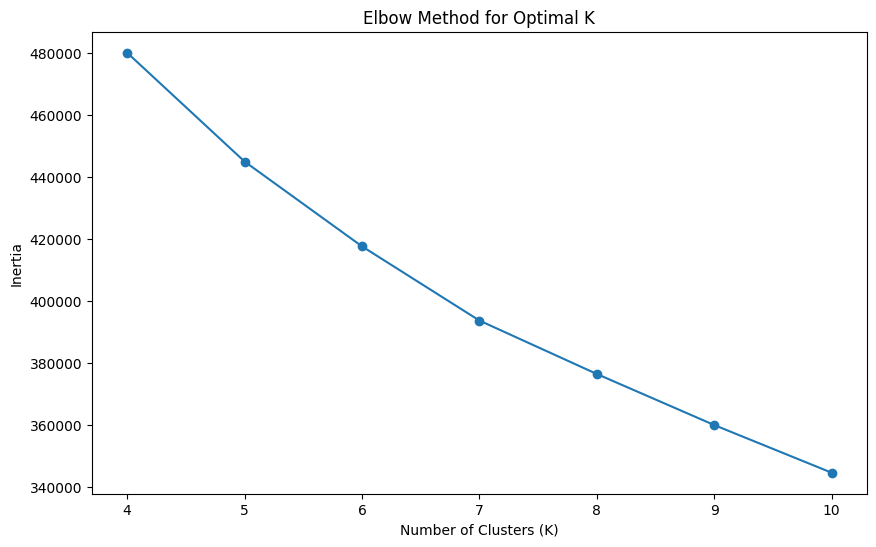

In [ ]:


# The "elbow method" can be used to visually inspect the best k
# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.show()


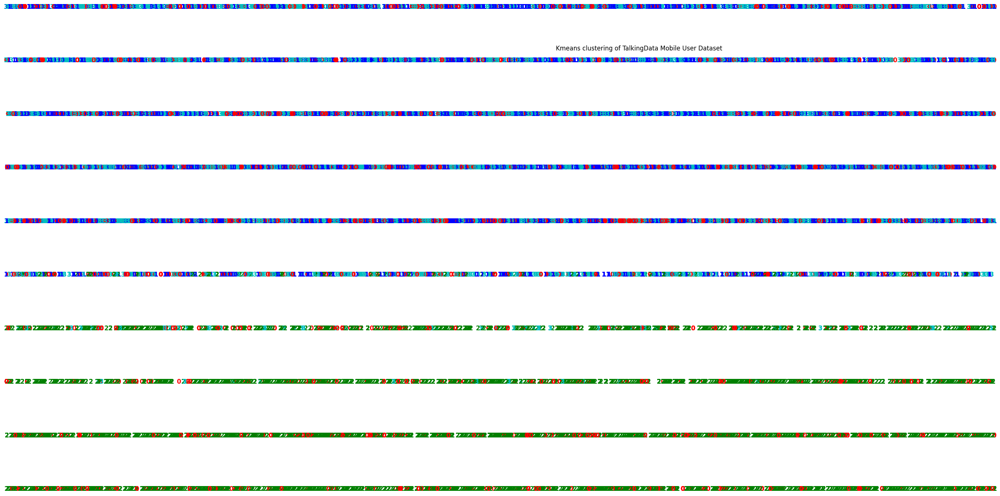

In [ ]:
# Perform K-means clustering with the best K value
best_kmeans = KMeans(n_clusters=best_k, random_state=42)
best_labels = best_kmeans.fit_predict(X_scaled)

# Plot using best_labels from K-means clustering
plt.figure(figsize=(10, 5))
colours = ["r", "b", "g", "c", "m", "y", "k", "r", "burlywood", "chartreuse"]
for i, label in enumerate(best_labels):
    plt.text(X_scaled[i, 0], X_scaled[i, 1], str(label),
             color=colours[int(label)],
             fontdict={'weight': 'bold', 'size': 12}
        )
plt.title('Kmeans clustering of TalkingData Mobile User Dataset')
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


#####The plot shows little or no separation, the labels mostly sit on each other. Labels 0 and 2 are separated from the others but the are not clustered together looks like a lot of outliers exist.
####Apply PCA to reduce dimensionality to the scaled data then apply K-means again.

In [ ]:
# Apply PCA to reduce dimensionality
X_pca = PCA(n_components=2).fit_transform(X_scaled)

In [ ]:
# Calculate silhouette scores for each K value on PCA data
print("Silhouette Scores for K-means with PCA on scaled data")
pca_silhouette_scores = []
pca_inertia_values = []
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_pca)
    silhouette_avg = silhouette_score(X_pca, labels)
    pca_silhouette_scores.append(silhouette_avg)
    pca_inertia_values.append(kmeans.inertia_)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.2f}")

# Find the best K value on PCA data
pca_best_silhouette_score = max(pca_silhouette_scores)
pca_best_k = k_values[np.argmax(pca_silhouette_scores)]
print(f"The best PCA K value based on silhouette score: {pca_best_k} with silhouette score of: {pca_best_silhouette_score}")

Silhouette Scores for K-means with PCA on scaled data
For n_clusters = 4, the silhouette score is 0.35
For n_clusters = 5, the silhouette score is 0.36
For n_clusters = 6, the silhouette score is 0.35
For n_clusters = 7, the silhouette score is 0.34
For n_clusters = 8, the silhouette score is 0.35
For n_clusters = 9, the silhouette score is 0.36
For n_clusters = 10, the silhouette score is 0.34
The best PCA K value based on silhouette score: 5 with silhouette score of: 0.36143962726195683


##### Some improvement in the Silhouette value from 0.171 to 0.361

In [ ]:
# Perform K-means clustering with the best K value
pca_best_kmeans = KMeans(n_clusters=pca_best_k, random_state=42)
pca_best_labels = pca_best_kmeans.fit_predict(X_pca)



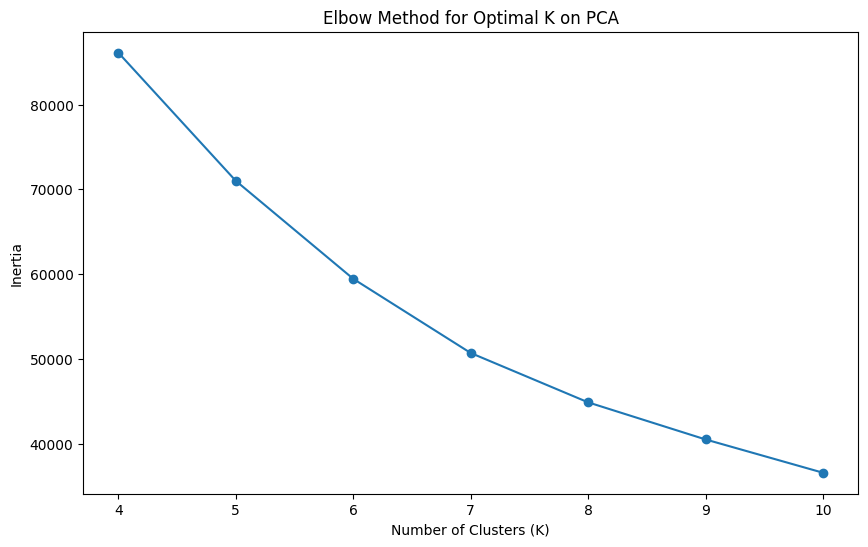

In [ ]:
# The "elbow method" can be used to visually inspect the best k on PCA
# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, pca_inertia_values, marker='o')
plt.title('Elbow Method for Optimal K on PCA')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.show()

##### The best silouette score improved after PCA was applied to the scaled data. Also the Best K is closer to what the Elbow method revealed. A score of 0.36 suggests that the clusters are somewhat distinct, but there might be room for improvement in terms of separation between clusters.

Now, we proceed with visualization to interpret the characteristics of these clusters and understand their meaning in the context of the dataset and research question.

#### Plot the data for PCA/K-means


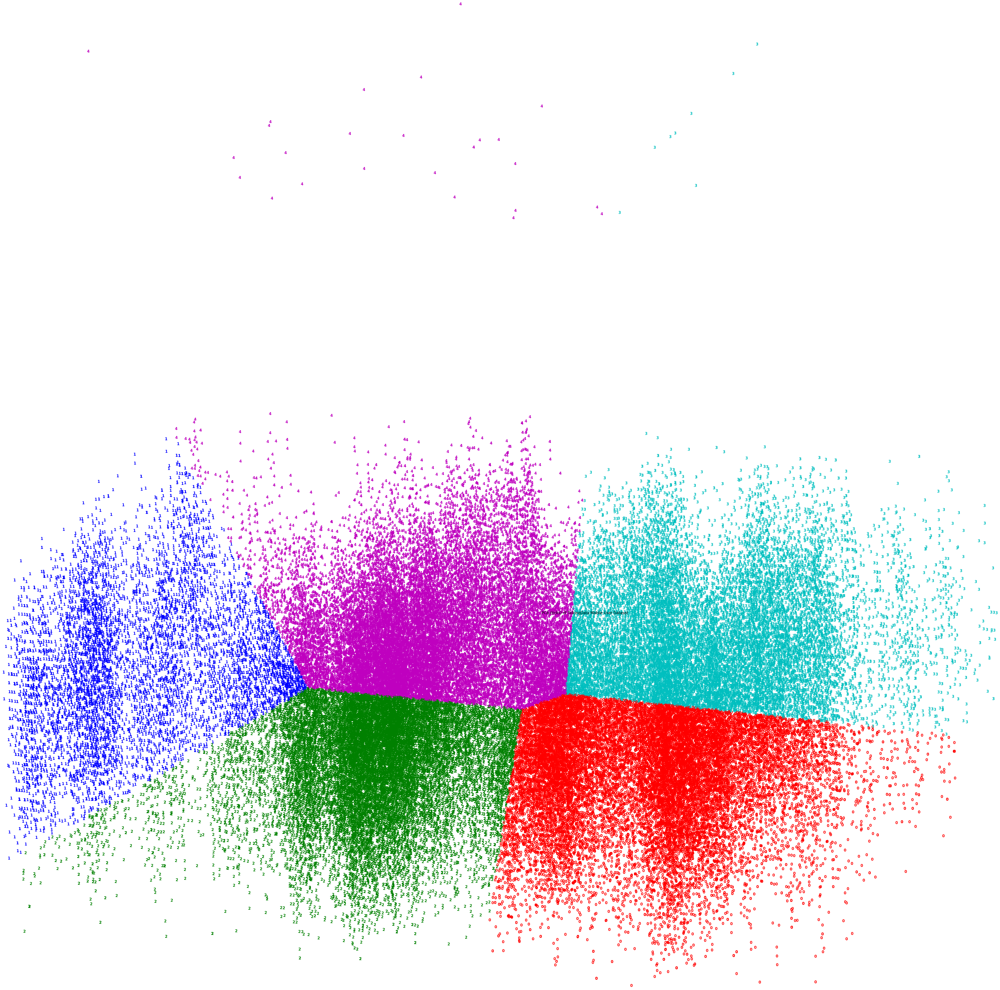

In [ ]:
# Plot using pca_best_labels from K-means clustering 09/24/23 most recent
plt.figure(figsize=(10, 5))
colours = ["r", "b", "g", "c", "m", "y", "k", "r", "burlywood", "chartreuse"]
for i, label in enumerate(pca_best_labels):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(label),
             color=colours[int(label)],
             fontdict={'weight': 'bold', 'size': 12}
        )
plt.title('PCA (ticks) of TalkingData Mobile User Dataset')
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


The graph shows clusters 0, 2, 3, and 4 nicely clustered together, while 1 is a little scattered but grouped together, though not much gap separating the clusters from each other. Also clusters 3 and 4 have some outliers far off from the rest of the clusters.

### 4.2 For PCA/K-means (K>= 4), draw the bar graphs to answer the following questions:
  1. Which cluster contains the most usage by females between 27 and 32?
  2. Which cluster contains the most device variety by males between 29 and 38?
  

In [ ]:
unbalanced_talking_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120323 entries, 0 to 120322
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   device_id        120323 non-null  int64 
 1   gender           120323 non-null  object
 2   age              120323 non-null  int64 
 3   age_group        120323 non-null  object
 4   phone_brand      120323 non-null  object
 5   device_model     120323 non-null  object
 6   day              120323 non-null  int64 
 7   is_male          120323 non-null  int64 
 8   phone_brand_id   120323 non-null  int64 
 9   device_model_id  120323 non-null  int64 
 10  age_group_id     120323 non-null  int64 
 11  year             120323 non-null  int64 
 12  month            120323 non-null  int64 
 13  hour             120323 non-null  int64 
 14  minute           120323 non-null  int64 
 15  second           120323 non-null  int64 
 16  group            120323 non-null  object
 17  group_id  

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '3'),
  Text(1, 0, '4'),
  Text(2, 0, '0'),
  Text(3, 0, '2'),
  Text(4, 0, '1')])

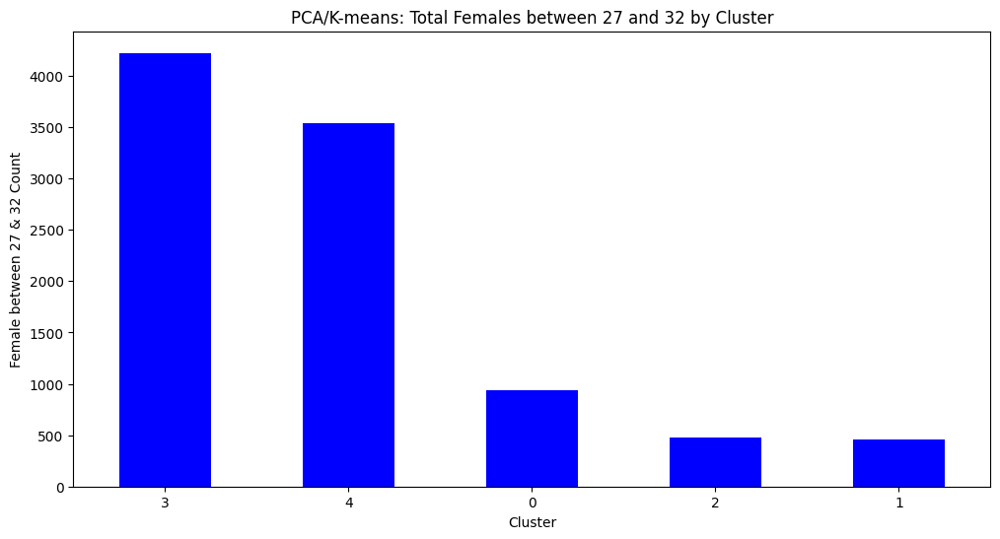

In [ ]:
# Filter data for PCA/K-means (K = 5) results
pca_kmeans_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_kmeans_df['cluster'] = pca_best_labels
pca_kmeans_df['age'] = unbalanced_talking_data_df['age']
pca_kmeans_df['gender'] = unbalanced_talking_data_df['gender']

# Calculate total female Count between 27 and 32
females = pca_kmeans_df[(pca_kmeans_df['gender'] == 'F')]
female_27_32 = females[(females['age'] >= 27) & (females['age'] <= 32)]

female_cluster_counts = female_27_32['cluster'].value_counts()
max_female_cluster = female_cluster_counts.idxmax()
# Plot bar graphs
plt.figure(figsize=(12, 6))
female_cluster_counts.plot(kind='bar', color='blue')
plt.title('PCA/K-means: Total Females between 27 and 32 by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Female between 27 & 32 Count')
plt.xticks(rotation=0)



#### Sub Questions
#### 4.2.1. Which cluster contains the most usage by females between 27 and 32?
      

In [ ]:
# Print the result
print(f"PCA/K-means: Cluster {max_female_cluster} has the most usage by females between 27 and 32 with a total count of {female_cluster_counts[max_female_cluster]}")

PCA/K-means: Cluster 3 has the most usage by females between 27 and 32 with a total count of 4222


#### 4.2.2. Which cluster contains the most device variety by males between 29 and 38?
  

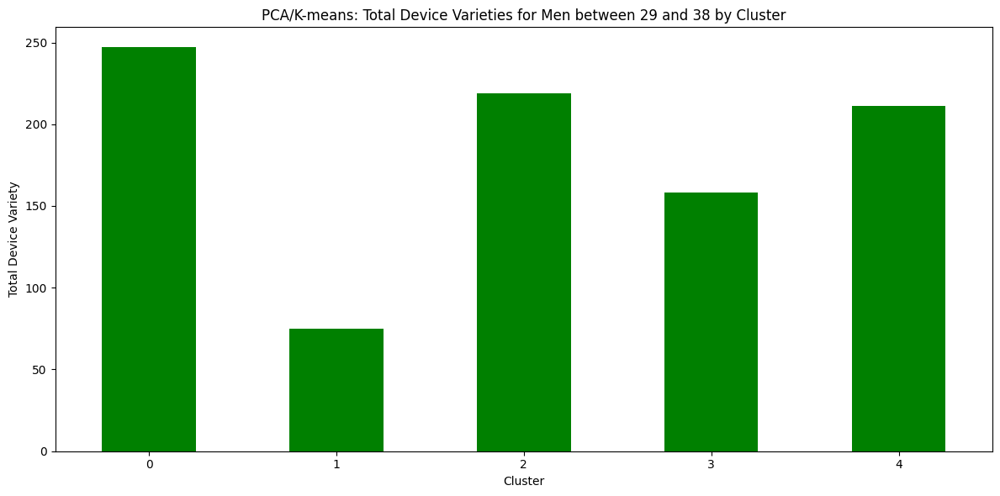

In [ ]:
# Calculate total delay minutes for each cluster during rush hour on weekdays (assuming rush hour is from 7 AM to 9 AM)
# Filtering for weekdays (0-4)
pca_kmeans_df['device_model_id'] = unbalanced_talking_data_df['device_model_id']

male_29_38 = pca_kmeans_df[(pca_kmeans_df['gender'] == 'M') & (pca_kmeans_df['age'] >= 29) & (pca_kmeans_df['age'] <= 38)]
device_varieties = male_29_38.groupby('cluster')['device_model_id'].nunique()
max_device_variety_cluster = device_varieties.idxmax()

# Plot bar graphs
plt.figure(figsize=(12, 6))
device_varieties.plot(kind='bar', color='green')
plt.title('PCA/K-means: Total Device Varieties for Men between 29 and 38 by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Total Device Variety')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

In [ ]:
# Print the result
print(f"PCA/K-means: Cluster {max_device_variety_cluster} has the most Device Varieties for Men between 29 and 38 with a total of {device_varieties[max_device_variety_cluster]}.")

PCA/K-means: Cluster 0 has the most Device Varieties for Men between 29 and 38 with a total of 247.


Silhouette scores are useful for assessing the quality of clustering when ground truth labels are not available. In this case, I determined that the best K value for the PCA-transformed data is 5, with a silhouette score of approximately 0.36.

This indicates that, according to the silhouette score, the data points in the PCA space are reasonably well-clustered into 5 distinct clusters. Keeping in mind that the silhouette score is just one metric, and it's also important to visually inspect the resulting clusters to ensure they make sense and align with the domain knowledge.

Next, let's proceed with applying GMM clustering and visualize the clusters using the t-SNE visualization.

###4.3. Using t-SNE and GMM to do the clustering (visualizations and many clusters, justify using silhouette scores)
  

In [ ]:
research_features = ['device_id', 'group_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
research_data = talking_data_df[research_features]
selected_features = ['device_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
X = unbalanced_talking_data_df[research_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# Determine the best number of components (clusters) for GMM using silhouette score
best_gmm_score = -1
best_gmm_components = -1
for n_components in range(4, 11):
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    labels = gmm.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    print(f"For n_clusters = {n_components}, the silhouette score is {score:.3f}")
    if score > best_gmm_score:
        best_gmm_score = score
        best_gmm_components = n_components


print(f"TalkingData: Best number of components for GMM: {best_gmm_components} with score: {best_gmm_score}")

For n_clusters = 4, the silhouette score is 0.094
For n_clusters = 5, the silhouette score is 0.138
For n_clusters = 6, the silhouette score is 0.055
For n_clusters = 7, the silhouette score is 0.053
For n_clusters = 8, the silhouette score is 0.028
For n_clusters = 9, the silhouette score is 0.022
For n_clusters = 10, the silhouette score is 0.047
TalkingData: Best number of components for GMM: 5 with score: 0.13764016474103719


In [ ]:
# Perform GMM clustering with the best number of components
best_gmm = GaussianMixture(n_components=best_gmm_components, random_state=42)
gmm_labels = best_gmm.fit_predict(X_scaled)



In [ ]:
import plotly.express as px

# Create a DataFrame for visualization
vis_df = pd.DataFrame({'PC1': X_scaled[:, 0], 'PC2': X_scaled[:, 1], 'Cluster': gmm_labels})

# Create an interactive scatter plot using Plotly
fig = px.scatter(vis_df, x='PC1', y='PC2', color='Cluster', title='Using Gaussian Mixture Model Visualization of TalkingData Mobile User')
fig.show()

#### The plot shows little or no separation, the clusters mostly sit on each other.

### Apply t-SNE to reduce dimensionality of the scaled data then apply K-means again.

In [ ]:
# Apply t-SNE to reduce dimensionality
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)



In [ ]:
# Determine the best number of components (clusters) for t-SNE/GMM using silhouette score
tsne_best_gmm_score = -1
tsne_best_gmm_components = -1
print("Silhouette Scores for scaled data with t-SNE/GMM")
for n_components in range(4, 11):
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    labels = gmm.fit_predict(X_tsne)
    score = silhouette_score(X_tsne, labels)
    print(f"For n_clusters = {n_components}, the silhouette score is {score:.3f}")
    if score > tsne_best_gmm_score:
        tsne_best_gmm_score = score
        tsne_best_gmm_components = n_components


print(f"TalkingData: Best number of components for t-SNE/GMM: {tsne_best_gmm_components} with silhouette score: {tsne_best_gmm_score}")

Silhouette Scores for scaled data with t-SNE/GMM
For n_clusters = 4, the silhouette score is 0.366
For n_clusters = 5, the silhouette score is 0.350
For n_clusters = 6, the silhouette score is 0.367
For n_clusters = 7, the silhouette score is 0.351
For n_clusters = 8, the silhouette score is 0.348
For n_clusters = 9, the silhouette score is 0.351
For n_clusters = 10, the silhouette score is 0.340
TalkingData: Best number of components for t-SNE/GMM: 6 with silhouette score: 0.36724209785461426


#### The best silhouette score improved significantly from - to - after t-SNE was applied to the scaled data. A score of --- suggests that the clusters are distinct, but there is room for improvement in terms of separation between clusters.

In [ ]:
# Perform t-SNE/GMM clustering with the best number of components
tsne_best_gmm = GaussianMixture(n_components=tsne_best_gmm_components, random_state=42)
tsne_gmm_labels = tsne_best_gmm.fit_predict(X_tsne)

In [ ]:
import plotly.express as px

# Create a DataFrame for visualization
vis_df = pd.DataFrame({'PC1': X_tsne[:, 0], 'PC2': X_tsne[:, 1], 'Cluster': tsne_gmm_labels})

# Create an interactive scatter plot using Plotly
fig = px.scatter(vis_df, x='PC1', y='PC2', color='Cluster', title='t-SNE Clustering using Gaussian Mixture Model - TalkingData Mobile User')
fig.show()


### The t-SNE/GMM plot looks nicely separated with none of the 6 clusters sitting on the other.

### 4.4. For t-SNE/GMM (K>= 4), draw the bar graphs to answer the following questions:
  1. Which cluster contains the most usage by females between 27 and 32?
  2. Which cluster contains the most device variety by males between 29 and 38?


#### Sub Questions
#### 4.4.1. Which cluster contains the most usage by females between 27 and 32?
      

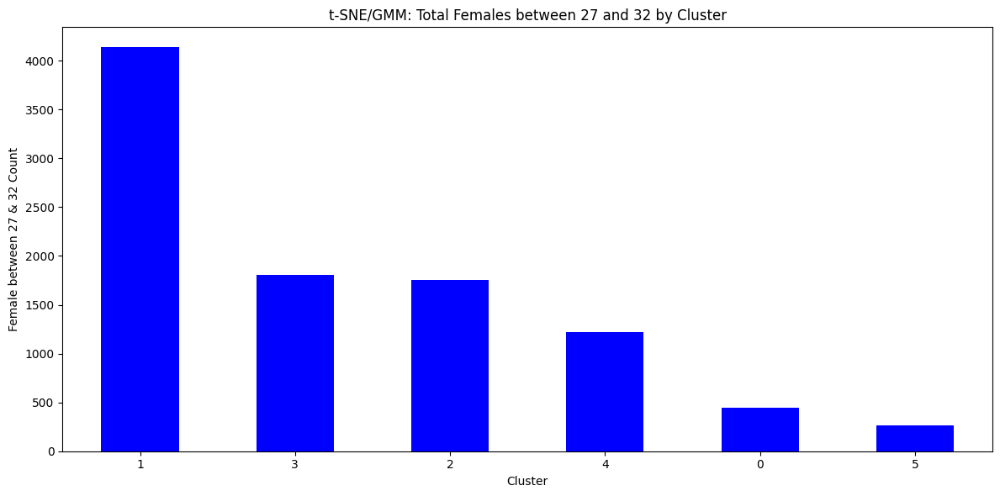

t-SNE/GMM: Cluster 1 has the most usage by females between 27 and 32 with a total count of 4136


In [ ]:
# Extract relevant columns from the original dataset and GMM labels
gmm_cluster_df = pd.DataFrame({'cluster': tsne_gmm_labels})

gmm_cluster_df['device_model_id'] = unbalanced_talking_data_df['device_model_id']
gmm_cluster_df['age'] = unbalanced_talking_data_df['age']
gmm_cluster_df['gender'] = unbalanced_talking_data_df['gender']

# Calculate total female Count between 27 and 32
females = gmm_cluster_df[(gmm_cluster_df['gender'] == 'F')]
female_27_32 = females[(females['age'] >= 27) & (females['age'] <= 32)]

female_cluster_counts = female_27_32['cluster'].value_counts()
max_female_cluster = female_cluster_counts.idxmax()
# Plot bar graphs
plt.figure(figsize=(12, 6))
female_cluster_counts.plot(kind='bar', color='blue')
plt.title('t-SNE/GMM: Total Females between 27 and 32 by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Female between 27 & 32 Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print(f"t-SNE/GMM: Cluster {max_female_cluster} has the most usage by females between 27 and 32 with a total count of {female_cluster_counts[max_female_cluster]}")

#### 4.4.2. Which cluster contains the most device variety by males between 29 and 38?


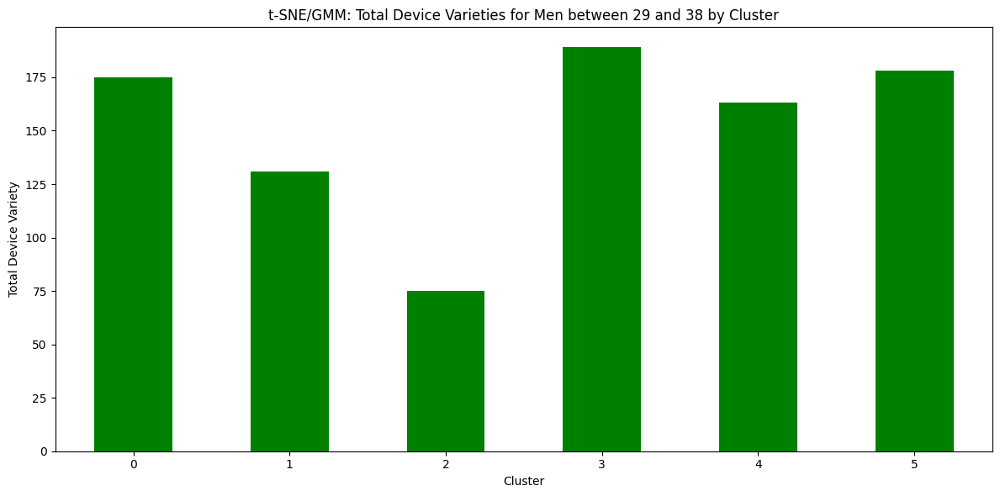

t-SNE/GMM: Cluster 3 has the most Device Varieties for Men between 29 and 38 with a total of 189.


In [ ]:
# Filter data for males between 29 amd 38
male_29_38 = gmm_cluster_df[(gmm_cluster_df['gender'] == 'M') & (gmm_cluster_df['age'] >= 29) & (gmm_cluster_df['age'] <= 38)]
device_varieties = male_29_38.groupby('cluster')['device_model_id'].nunique()
max_device_variety_cluster = device_varieties.idxmax()

# Plot bar graphs
plt.figure(figsize=(12, 6))
device_varieties.plot(kind='bar', color='green')
plt.title('t-SNE/GMM: Total Device Varieties for Men between 29 and 38 by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Total Device Variety')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


print(f"t-SNE/GMM: Cluster {max_device_variety_cluster} has the most Device Varieties for Men between 29 and 38 with a total of {device_varieties[max_device_variety_cluster]}.")


##5. Deep Learning
    1. Try different ANN models and train them on the training set with the following:
      1. Number of layers
      2. Activation functions of the layers
      3. Number of neurons in the layers
      4. Different batch sizes during training
      5. Comparing Training Scores
    2. CNN & RNN
      1. with unbalanced dataset show classification report
      2. with balanced dataset show classification report
      3. using best SelectKBest Random Forest Model (the best model so far)
    3. Compare the models' training scores and interpret the results.
    4. Evaluate how the models perform on the test set. Compare the results of the models.


### 5.1 Artificial Neural Network (ANN)

In [ ]:
# Step 1:  Building and Training different ANN models
selected_features = ['device_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
X = unbalanced_talking_data_df[selected_features]
y = unbalanced_talking_data_df['group_id']
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.4)

x_train.shape

(72193, 5)

In [ ]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72193 entries, 23972 to 42775
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   device_id        72193 non-null  int64
 1   day              72193 non-null  int64
 2   hour             72193 non-null  int64
 3   phone_brand_id   72193 non-null  int64
 4   device_model_id  72193 non-null  int64
dtypes: int64(5)
memory usage: 3.3 MB


In [ ]:
x_test.shape

(48130, 5)

In [ ]:
y_train_encoded = to_categorical(y_train)
y_test_encoded = to_categorical(y_test)

In [ ]:
# Model 1
model1 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')
])
model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history1 = model1.fit(x_train, y_train_encoded, epochs=10, batch_size=64, validation_data=(x_test, y_test_encoded))
test_loss1, test_acc1 = model1.evaluate(x_test, y_test_encoded)
print(f'Test accuracy1: {test_acc1}, Test loss1: {test_loss1}')


# Model 2
model2 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(10, activation='softmax')
])
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history2 = model2.fit(x_train, y_train_encoded, epochs=10, batch_size=128, validation_data=(x_test, y_test_encoded))
test_loss2, test_acc2 = model2.evaluate(x_test, y_test_encoded)
print(f'Test accuracy2: {test_acc2}, Test loss2: {test_loss2}')


# Model 3
model3 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(128, activation='tanh'),
    Dense(64, activation='tanh'),
    Dense(10, activation='softmax')
])
model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history3 = model3.fit(x_train, y_train_encoded, epochs=10, batch_size=64, validation_data=(x_test, y_test_encoded))
test_loss3, test_acc3 = model3.evaluate(x_test, y_test_encoded)
print(f'Test accuracy3: {test_acc3}, Test loss3: {test_loss3}')


# Model 4
model4 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')
])
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history4 = model4.fit(x_train, y_train_encoded, epochs=10, batch_size=512, validation_data=(x_test, y_test_encoded))
test_loss4, test_acc4 = model4.evaluate(x_test, y_test_encoded)
print(f'Test accuracy4: {test_acc4}, Test loss4: {test_loss4}')


# Model 5
model5 = Sequential([
    layers.Dense(32, activation='relu', input_shape=(5,)),  # Input shape matches x_train shape.
    layers.Dense(10, activation='softmax')  # 10 neurons in the output layer for 10 classes
])

model5.compile(optimizer='adam',
               loss='categorical_crossentropy',
               metrics=['accuracy'])

history5 = model5.fit(x_train, y_train_encoded, epochs=20, batch_size=32, validation_split=0.2)
test_loss5, test_acc5 = model5.evaluate(x_test, y_test_encoded)
print(f'Test accuracy5: {test_acc5}, Test loss5: {test_loss5}')


Epoch 1/10
1129/1129 [==============================] - 8s 5ms/step - loss: 8505223.0000 - accuracy: 0.1177 - val_loss: 3526828.7500 - val_accuracy: 0.1422
Epoch 2/10
1129/1129 [==============================] - 3s 3ms/step - loss: 4075887.0000 - accuracy: 0.1170 - val_loss: 6295546.5000 - val_accuracy: 0.1105
Epoch 3/10
1129/1129 [==============================] - 6s 6ms/step - loss: 3903296.0000 - accuracy: 0.1177 - val_loss: 4111410.7500 - val_accuracy: 0.1000
Epoch 4/10
1129/1129 [==============================] - 4s 4ms/step - loss: 3747228.0000 - accuracy: 0.1163 - val_loss: 3447766.5000 - val_accuracy: 0.0630
Epoch 5/10
1129/1129 [==============================] - 3s 3ms/step - loss: 3761592.0000 - accuracy: 0.1199 - val_loss: 2751563.5000 - val_accuracy: 0.1047
Epoch 6/10
1129/1129 [==============================] - 3s 2ms/step - loss: 3484780.0000 - accuracy: 0.1177 - val_loss: 3348900.5000 - val_accuracy: 0.1044
Epoch 7/10
1129/1129 [==============================] - 3s 3ms/s

In [ ]:
print("Model 1 Training Accuracy:", max(history1.history['accuracy']))
print("Model 2 Training Accuracy:", max(history2.history['accuracy']))
print("Model 3 Training Accuracy:", max(history3.history['accuracy']))
print("Model 4 Training Accuracy:", max(history4.history['accuracy']))
print("Model 5 Training Accuracy:", max(history5.history['accuracy']))



Model 1 Training Accuracy: 0.11987312138080597
Model 2 Training Accuracy: 0.15677420794963837
Model 3 Training Accuracy: 0.15429474413394928
Model 4 Training Accuracy: 0.12117518484592438
Model 5 Training Accuracy: 0.12303909659385681


####5.1.5: Comparing Training Scores
Test accuracy1: 0.1004570946097374, Test loss1: 2998315.0

Test accuracy2: 0.1554955393075943, Test loss2: 2.2069268226623535

Test accuracy3: 0.15485143661499023, Test loss3: 2.212794542312622

Test accuracy4: 0.14217743277549744, Test loss4: 3103369.5

Test accuracy5: 0.13106170296669006, Test loss5: 1534474.75



#### Analysis:

##### Accuracy:

The highest accuracy is achieved by Model2 (15.54%), closely followed by Model3 (15.48%).
Model4 and Model5 are slightly less accurate, with accuracies of 14.21% and 13.10%, respectively.
Model1 has the lowest accuracy at 10.04%.

##### Loss:

Model2 and Model3 have extremely low losses, near 2.2, which is vastly lower than the other models.
Model1 and Model4 have high losses in the range of 3 million.
Model5's loss is around 1.5 million, which is lower than Model1 and Model4 but significantly higher than Model2 and Model3.

Given the results, Model2 appears to be the best-performing model considering both accuracy and loss. However, the dramatic difference in loss values between Model2, Model3, and the other models suggests a difference in the nature of these models

### Graphical Representation

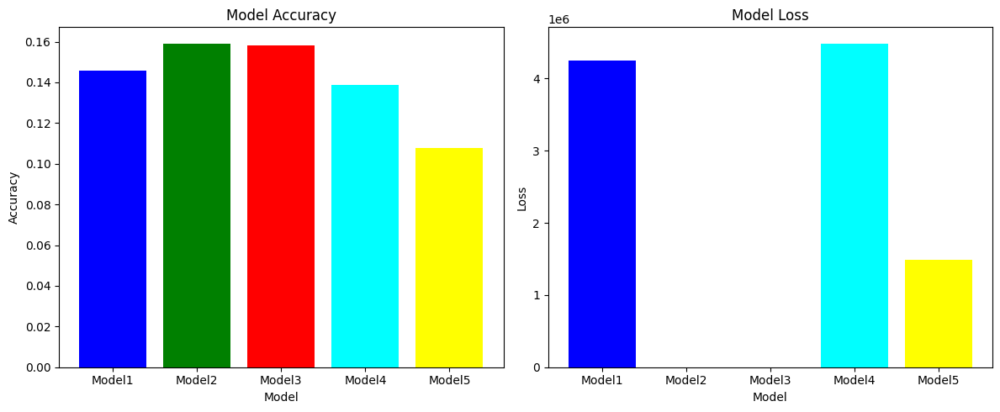

In [ ]:
# Data
models = ['Model1', 'Model2', 'Model3', 'Model4', 'Model5']
accuracy = [0.14566798508167267, 0.1591522991657257, 0.15800955891609192, 0.13862456381320953, 0.10768751055002213]
loss = [4252695.0, 2.203671932220459, 2.207550048828125, 4487747.5, 1486651.25]

# Create a new figure with a specific size
plt.figure(figsize=(12, 5))

# Subplot for Accuracy
plt.subplot(1, 2, 1)
plt.bar(models, accuracy, color=['blue', 'green', 'red', 'cyan', 'yellow'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Model')

# Subplot for Loss
plt.subplot(1, 2, 2)
plt.bar(models, loss, color=['blue', 'green', 'red', 'cyan', 'yellow'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Model')

# Automatically adjust the layout
plt.tight_layout()

# Display the plots
plt.show()

##### Plot Model2 data (Best performing)

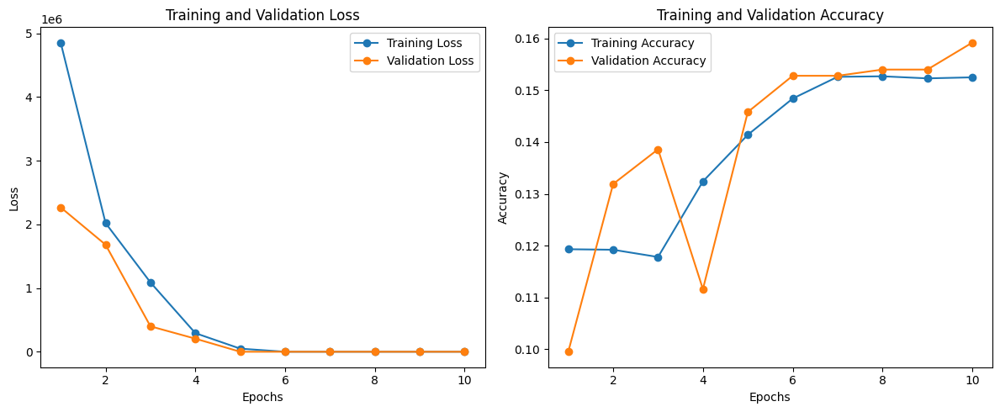

In [ ]:
# Model2 Data
epochs = list(range(1, 11))
training_loss = [4853545.5000, 2020499.5000, 1088472.2500, 292186.0938, 48862.3242, 2.2332, 2.2173, 2.2107, 2.2083, 2.2075]
validation_loss = [2266588.7500, 1680652.5000, 399238.1250, 205401.1406, 2.2448, 2.2214, 2.2102, 2.2058, 2.2042, 2.2037]

training_accuracy = [0.1193, 0.1192, 0.1178, 0.1324, 0.1414, 0.1484, 0.1526, 0.1527, 0.1523, 0.1525]
validation_accuracy = [0.0995, 0.1319, 0.1386, 0.1116, 0.1458, 0.1528, 0.1528, 0.1540, 0.1540, 0.1592]

# Plotting Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, training_loss, label='Training Loss', marker='o')
plt.plot(epochs, validation_loss, label='Validation Loss', marker='o')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, training_accuracy, label='Training Accuracy', marker='o')
plt.plot(epochs, validation_accuracy, label='Validation Accuracy', marker='o')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

#### Do same with scaled data

In [ ]:
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [ ]:
# Model 1
model1 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')
])
model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history1 = model1.fit(x_train_scaled, y_train_encoded, epochs=10, batch_size=64, validation_data=(x_test_scaled, y_test_encoded))
test_loss1, test_acc1 = model1.evaluate(x_test_scaled, y_test_encoded)
print(f'Test accuracy1: {test_acc1}, Test loss1: {test_loss1}')

# Model 2
model2 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(10, activation='softmax')
])
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history2 = model2.fit(x_train_scaled, y_train_encoded, epochs=10, batch_size=128, validation_data=(x_test_scaled, y_test_encoded))
test_loss2, test_acc2 = model2.evaluate(x_test_scaled, y_test_encoded)
print(f'Test accuracy2: {test_acc2}, Test loss2: {test_loss2}')

# Model 3
model3 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(128, activation='tanh'),
    Dense(64, activation='tanh'),
    Dense(10, activation='softmax')
])
model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history3 = model3.fit(x_train_scaled, y_train_encoded, epochs=10, batch_size=64, validation_data=(x_test_scaled, y_test_encoded))
test_loss3, test_acc3 = model3.evaluate(x_test_scaled, y_test_encoded)
print(f'Test accuracy3: {test_acc3}, Test loss3: {test_loss3}')

# Model 4
model4 = Sequential([
    Flatten(input_shape=(5,)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')
])
model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history4 = model4.fit(x_train_scaled, y_train_encoded, epochs=10, batch_size=512, validation_data=(x_test_scaled, y_test_encoded))
test_loss4, test_acc4 = model4.evaluate(x_test_scaled, y_test_encoded)
print(f'Test accuracy4: {test_acc4}, Test loss4: {test_loss4}')

# Model 5
model5 = Sequential([
    layers.Dense(32, activation='relu', input_shape=(5,)),  # Input shape matches x_train shape.
    layers.Dense(10, activation='softmax')  # 10 neurons in the output layer for 10 classes
])

model5.compile(optimizer='adam',
               loss='categorical_crossentropy',
               metrics=['accuracy'])

history5 = model5.fit(x_train_scaled, y_train_encoded, epochs=20, batch_size=32, validation_split=0.2)
test_loss5, test_acc5 = model5.evaluate(x_test_scaled, y_test_encoded)
print(f'Test accuracy5: {test_acc5}, Test loss5: {test_loss5}')


Epoch 1/10
1129/1129 [==============================] - 3s 2ms/step - loss: 2.2069 - accuracy: 0.1595 - val_loss: 2.1872 - val_accuracy: 0.1744
Epoch 2/10
1129/1129 [==============================] - 2s 2ms/step - loss: 2.1878 - accuracy: 0.1767 - val_loss: 2.1766 - val_accuracy: 0.1848
Epoch 3/10
1129/1129 [==============================] - 2s 2ms/step - loss: 2.1806 - accuracy: 0.1816 - val_loss: 2.1727 - val_accuracy: 0.1838
Epoch 4/10
1129/1129 [==============================] - 2s 2ms/step - loss: 2.1761 - accuracy: 0.1836 - val_loss: 2.1700 - val_accuracy: 0.1844
Epoch 5/10
1129/1129 [==============================] - 3s 2ms/step - loss: 2.1732 - accuracy: 0.1851 - val_loss: 2.1664 - val_accuracy: 0.1879
Epoch 6/10
1129/1129 [==============================] - 3s 2ms/step - loss: 2.1704 - accuracy: 0.1880 - val_loss: 2.1650 - val_accuracy: 0.1941
Epoch 7/10
1129/1129 [==============================] - 2s 2ms/step - loss: 2.1681 - accuracy: 0.1896 - val_loss: 2.1633 - val_accuracy:

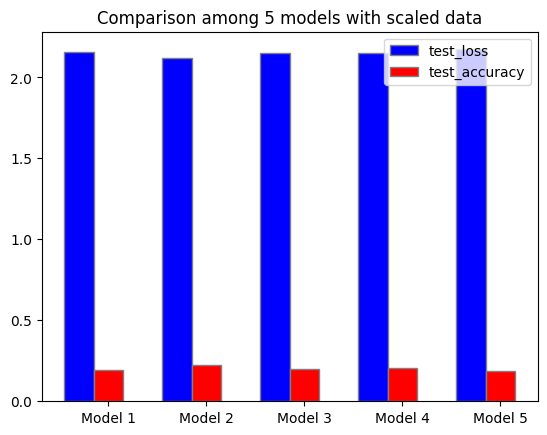

In [ ]:
models = ['Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5']
test_loss = [2.1592, 2.1192, 2.1482, 2.1527, 2.1734]
test_accuracy = [0.1950, 0.2251, 0.2012, 0.2054, 0.1860]

barWidth = 0.3
r1 = np.arange(len(test_loss))
r2 = [x + barWidth for x in r1]

plt.bar(r1, test_loss, width=barWidth, color='blue', edgecolor='grey', label='test_loss')
plt.bar(r2, test_accuracy, width=barWidth, color='red', edgecolor='grey', label='test_accuracy')

# Description
plt.title('Comparison among 5 models with scaled data')
plt.xticks([r + barWidth for r in range(len(test_loss))], models)
plt.legend()

plt.show()

#### Comparing the Results on Scaled data
1. Test Loss:
The test loss is an indication of how well a model has learned to predict the given data. Lower values are preferable as they indicate smaller errors.

Here's the ranking based on test loss:

Model 2: 2.1192
Model 3: 2.1482
Model 4: 2.1527
Model 1: 2.1592
Model 5: 2.1734
From the test loss perspective, Model 2 has the lowest test loss, making it the best among the five in this aspect.

2. Test Accuracy:
Accuracy gives an overview of the percentage of correct predictions out of total predictions. Higher values are preferable as they indicate a higher proportion of correct predictions.

Here's the ranking based on test accuracy:

Model 2: 0.2251 (22.51%)
Model 4: 0.2054 (20.54%)
Model 3: 0.2012 (20.12%)
Model 1: 0.1950 (19.50%)
Model 5: 0.1860 (18.60%)
From the test accuracy perspective, Model 2 also has the highest accuracy, making it the best among the five in this regard as well.

##### Conclusion:
Comparing the models based on both test loss and test accuracy, Model 2 emerges as the best performing model among the five. It has the lowest test loss and the highest test accuracy.

On the other hand, Model 5 appears to be the weakest model as it ranks last in both test loss and test accuracy.

In [ ]:
x_train_reshaped = x_train.values.reshape(x_train.shape[0], x_train.shape[1], 1)
x_test_reshaped = x_test.values.reshape(x_test.shape[0], x_test.shape[1], 1)

# Building a simple CNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(x_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Adjust the output layer based on your task (regression or classification)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  # Adjust based on your task

# Train the model
model.fit(x_train_reshaped, y_train, epochs=10, batch_size=64, validation_data=(x_test_reshaped, y_test))


Epoch 1/10
1129/1129 [==============================] - 5s 3ms/step - loss: -8316054405120.0000 - accuracy: 0.0662 - val_loss: -32806373687296.0000 - val_accuracy: 0.0632
Epoch 2/10
1129/1129 [==============================] - 3s 3ms/step - loss: -108258761113600.0000 - accuracy: 0.0662 - val_loss: -216127955271680.0000 - val_accuracy: 0.0632
Epoch 3/10
1129/1129 [==============================] - 3s 3ms/step - loss: -393691969617920.0000 - accuracy: 0.0662 - val_loss: -611255786143744.0000 - val_accuracy: 0.0632
Epoch 4/10
1129/1129 [==============================] - 5s 4ms/step - loss: -908015477719040.0000 - accuracy: 0.0662 - val_loss: -1250287528443904.0000 - val_accuracy: 0.0632
Epoch 5/10
1129/1129 [==============================] - 3s 3ms/step - loss: -1677249556250624.0000 - accuracy: 0.0662 - val_loss: -2157927800504320.0000 - val_accuracy: 0.0632
Epoch 6/10
1129/1129 [==============================] - 3s 3ms/step - loss: -2729484197298176.0000 - accuracy: 0.0662 - val_loss: 

In [ ]:
# Normalize the data
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

# Reshape data to have a channel dimension
x_train = x_train.reshape(x_train.shape[0], 5, 1, 1)
x_test = x_test.reshape(x_test.shape[0], 5, 1, 1)

# Build the CNN model
model = Sequential([
    Conv2D(32, (2,1), activation='relu', input_shape=(5, 1, 1)),
    MaxPooling2D((2,1)),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

# Train the model
model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=10, batch_size=32)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 4, 1, 32)          96        
                                                                 
 max_pooling2d (MaxPooling2  (None, 2, 1, 32)          0         
 D)                                                              
                                                                 
 flatten_1 (Flatten)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 64)                4160      
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 4321 (16.88 KB)
Trainable params: 4321 (16.88 KB)
Non-trainable params: 0 (0.00 Byte)
____________________

In [ ]:
unbalanced_talking_data_df.info()
unbalanced_talking_data_df.shape


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120323 entries, 0 to 120322
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   device_id        120323 non-null  int64 
 1   gender           120323 non-null  object
 2   age              120323 non-null  int64 
 3   age_group        120323 non-null  object
 4   phone_brand      120323 non-null  object
 5   device_model     120323 non-null  object
 6   day              120323 non-null  int64 
 7   is_male          120323 non-null  int64 
 8   phone_brand_id   120323 non-null  int64 
 9   device_model_id  120323 non-null  int64 
 10  age_group_id     120323 non-null  int64 
 11  year             120323 non-null  int64 
 12  month            120323 non-null  int64 
 13  hour             120323 non-null  int64 
 14  minute           120323 non-null  int64 
 15  second           120323 non-null  int64 
 16  group            120323 non-null  object
 17  group_id  

(120323, 18)

### 5.2.1  Convolutional Neural Network (CNN) and Recurrent Neural Network (RNN) with unbalanced data
1. Building the Model:
Use CNN layers to capture local patterns and RNN layers to capture sequences in the data.
2. Training the Model:
Split the dataset into training and testing subsets.
Train the model.
3. Evaluating the Model:
Predict on the test set.
Generate a classification report.

In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Normalize the data
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape data to add channel dimension for CNN
X_train = X_train.reshape(X_train.shape[0], 5, 1)
X_test = X_test.reshape(X_test.shape[0], 5, 1)

# Build a CNN-RNN hybrid model
model = Sequential([
    Conv1D(64, 2, activation='relu', input_shape=(5, 1)),
    MaxPooling1D(2),
    LSTM(64, return_sequences=True),
    LSTM(32),
    Dense(64, activation='relu'),
    Dense(12, activation='softmax')  # Assuming 12 groups (change accordingly)
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

# Train the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

# Predict on test set
y_pred = model.predict(X_test)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_7 (Conv1D)           (None, 4, 64)             192       
                                                                 
 max_pooling1d_7 (MaxPoolin  (None, 2, 64)             0         
 g1D)                                                            
                                                                 
 lstm_12 (LSTM)              (None, 2, 64)             33024     
                                                                 
 lstm_13 (LSTM)              (None, 32)                12416     
                                                                 
 dense_16 (Dense)            (None, 64)                2112      
                                                                 
 dense_17 (Dense)            (None, 12)                780       
                                                      

### 5.2.2 CNN and RNN with balanced data

In [ ]:
selected_features = ['device_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
X2 = talking_data_df[selected_features]
y2 = talking_data_df['group_id']
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, stratify=y2, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_train_balanced1, y_train_balanced1 = smote.fit_resample(X_train2, y_train2)

# Normalize the data
scaler = MinMaxScaler()
X_train_balanced1 = scaler.fit_transform(X_train_balanced1)
X_test2 = scaler.transform(X_test2)

# Reshape data to add channel dimension for CNN
X_train2 = X_train_balanced1.reshape(X_train_balanced1.shape[0], 5, 1)
X_test2 = X_test2.reshape(X_test2.shape[0], 5, 1)


In [ ]:

# Train the model
model.fit(X_train2, y_train_balanced1, validation_data=(X_test2, y_test2), epochs=10, batch_size=32)

# Predict on test set
y_pred = model.predict(X_test2)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test2, y_pred_classes))

Epoch 1/10
4928/4928 [==============================] - 33s 7ms/step - loss: 2.1792 - accuracy: 0.2097 - val_loss: 2.1693 - val_accuracy: 0.2118
Epoch 2/10
4928/4928 [==============================] - 32s 7ms/step - loss: 2.1560 - accuracy: 0.2175 - val_loss: 2.1585 - val_accuracy: 0.2190
Epoch 3/10
4928/4928 [==============================] - 31s 6ms/step - loss: 2.1374 - accuracy: 0.2269 - val_loss: 2.1465 - val_accuracy: 0.2240
Epoch 4/10
4928/4928 [==============================] - 31s 6ms/step - loss: 2.1199 - accuracy: 0.2377 - val_loss: 2.1211 - val_accuracy: 0.2367
Epoch 5/10
4928/4928 [==============================] - 32s 6ms/step - loss: 2.1027 - accuracy: 0.2475 - val_loss: 2.1046 - val_accuracy: 0.2516
Epoch 6/10
4928/4928 [==============================] - 34s 7ms/step - loss: 2.0871 - accuracy: 0.2554 - val_loss: 2.0911 - val_accuracy: 0.2512
Epoch 7/10
4928/4928 [==============================] - 32s 6ms/step - loss: 2.0728 - accuracy: 0.2639 - val_loss: 2.0841 - val_ac

### 5.2.3 The best performing model from SelectKBest & RandomForest from [3.3.2.5.1] above together with CNN &RNN to see if results will be better

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [50, 100, 200],
      'max_depth': [None, 10, 20, 30],
      'min_samples_split': [2, 5, 10]
    },
    cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for RandomForest: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for RandomForest:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for RandomForest:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for RandomForest:")
    print(cross_val_score(RandomForestClassifier(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model RandomForest: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}

Classification Report for RandomForest:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      7388
           1       0.89      0.95      0.92      8139
           2       0.89      0.94      0.91      5987
           3       0.91      0.94      0.93      6111
           4       0.91      0.96      0.93      8366
           5       0.80      0.75      0.77      7158
           6       0.81      0.76      0.79      7884
           7       0.80      0.76      0.78      7735
           8       0.82      0.78      0.80      6554
           9       0.82      0.77      0.79      6615

    accuracy                           0.86     71937
   macro avg       0.85      0.86      0.85     71937
weighted avg       0.85      0.86      0.85     71937

Confusion Matrix for RandomForest:
[[6966   29   19   22   27   98   95   54   50   28]
 [  62 7724  

In [ ]:
try:
    # Starting a timer
    start_time = time.time()

    # GridSearch as already provided
    grid = GridSearchCV(RandomForestClassifier(),
    {
      'n_estimators': [200],
      'max_depth': [None],
      'min_samples_split': [2]
    },
    cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for RandomForest: {grid.best_params_}")

    # Get the best RF model
    best_rf = grid.best_estimator_
    X_train_transformed = best_rf.predict_proba(X_train)
    X_test_transformed = best_rf.predict_proba(X_test)

    # Reshape for CNN
    X_train_transformed = np.expand_dims(X_train_transformed, axis=2)
    X_test_transformed = np.expand_dims(X_test_transformed, axis=2)

    # CNN & RNN model
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=X_train_transformed.shape[1:]))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(64, return_sequences=True))
    model.add(LSTM(32))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(len(y.unique()), activation='softmax'))

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

    # Evaluate the deep learning model
    accuracy = model.evaluate(X_test_transformed, y_test)[1]
    print(f"Accuracy of the integrated model: {accuracy * 100:.2f}%")

    # Predict on test set
    y_pred = model.predict(X_test_transformed)
    y_pred_classes = tf.argmax(y_pred, axis=1)

    # Print classification report
    print(classification_report(y_test, y_pred_classes))

except Exception as e:
    print(f"An error occurred: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Epoch 1/10
3105/3105 [==============================] - 61s 18ms/step - loss: 0.0677 - accuracy: 0.9800 - val_loss: 2.1639 - val_accuracy: 0.8085
Epoch 2/10
3105/3105 [==============================] - 69s 22ms/step - loss: 8.1793e-04 - accuracy: 0.9998 - val_loss: 2.4292 - val_accuracy: 0.8077
Epoch 3/10
3105/3105 [==============================] - 44s 14ms/step - loss: 6.5643e-04 - accuracy: 0.9999 - val_loss: 2.7774 - val_accuracy: 0.8077
Epoch 4/10
3105/3105 [==============================] - 50s 16ms/step - loss: 7.6608e-05 - accuracy: 1.0000 - val_loss: 2.8722 - val_accuracy: 0.8029
Epoch 5/10
3105/3105 [==============================] - 46s 15ms/step - loss: 2.7219e-06 - accuracy: 1.0000 - val_loss: 3.0878 - val_accuracy: 0.8056
Epoch 6/10
3105/3105 [==============================] - 42s 14ms/step - loss: 5.7376e-07 - accuracy: 1.0000 - val_loss: 3.2400 - val_accuracy: 0.8100
Epoch

In [ ]:
# Get the best RF model
best_rf = grid.best_estimator_
X_train_transformed = best_rf.predict_proba(X_train)
X_test_transformed = best_rf.predict_proba(X_test)

# Reshape for CNN
X_train_transformed = np.expand_dims(X_train_transformed, axis=2)
X_test_transformed = np.expand_dims(X_test_transformed, axis=2)

# CNN & RNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=X_train_transformed.shape[1:]))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(64, return_sequences=True))
model.add(LSTM(32))
model.add(Dense(64, activation='relu'))
model.add(Dense(len(y.unique()), activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

# Evaluate the deep learning model
accuracy = model.evaluate(X_test_transformed, y_test)[1]
print(f"Accuracy of the integrated model: {accuracy * 100:.2f}%")

# Predict on test set
y_pred = model.predict(X_test_transformed)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Epoch 1/10
4282/4282 [==============================] - 62s 14ms/step - loss: 0.2083 - accuracy: 0.9401 - val_loss: 0.5243 - val_accuracy: 0.8477
Epoch 2/10
4282/4282 [==============================] - 55s 13ms/step - loss: 0.1441 - accuracy: 0.9597 - val_loss: 0.4963 - val_accuracy: 0.8584
Epoch 3/10
4282/4282 [==============================] - 54s 13ms/step - loss: 0.1378 - accuracy: 0.9607 - val_loss: 0.4897 - val_accuracy: 0.8523
Epoch 4/10
4282/4282 [==============================] - 53s 12ms/step - loss: 0.1345 - accuracy: 0.9612 - val_loss: 0.4738 - val_accuracy: 0.8569
Epoch 5/10
4282/4282 [==============================] - 59s 14ms/step - loss: 0.1327 - accuracy: 0.9611 - val_loss: 0.4887 - val_accuracy: 0.8557
Epoch 6/10
4282/4282 [==============================] - 54s 13ms/step - loss: 0.1314 - accuracy: 0.9610 - val_loss: 0.4772 - val_accuracy: 0.8582
Epoch 7/10
4282/4282 [==============================] - 54s 13ms/step - loss: 0.1301 - accuracy: 0.9612 - val_loss: 0.4734 -

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

# Evaluate the deep learning model
accuracy = model.evaluate(X_test_transformed, y_test)[1]
print(f"Accuracy of the integrated model: {accuracy * 100:.2f}%")

# Predict on test set
y_pred = model.predict(X_test_transformed)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Epoch 1/10
4282/4282 [==============================] - 74s 15ms/step - loss: 0.1276 - accuracy: 0.9612 - val_loss: 0.4726 - val_accuracy: 0.8584
Epoch 2/10
4282/4282 [==============================] - 54s 12ms/step - loss: 0.1269 - accuracy: 0.9616 - val_loss: 0.4647 - val_accuracy: 0.8592
Epoch 3/10
4282/4282 [==============================] - 52s 12ms/step - loss: 0.1263 - accuracy: 0.9615 - val_loss: 0.4663 - val_accuracy: 0.8589
Epoch 4/10
4282/4282 [==============================] - 55s 13ms/step - loss: 0.1256 - accuracy: 0.9616 - val_loss: 0.4657 - val_accuracy: 0.8574
Epoch 5/10
4282/4282 [==============================] - 52s 12ms/step - loss: 0.1249 - accuracy: 0.9616 - val_loss: 0.4663 - val_accuracy: 0.8584
Epoch 6/10
4282/4282 [==============================] - 55s 13ms/step - loss: 0.1245 - accuracy: 0.9618 - val_loss: 0.4645 - val_accuracy: 0.8581
Epoch 7/10
4282/4282 [==============================] - 56s 13ms/step - loss: 0.1236 - accuracy: 0.9622 - val_loss: 0.4699 -

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

# Evaluate the deep learning model
accuracy = model.evaluate(X_test_transformed, y_test)[1]
print(f"Accuracy of the integrated model: {accuracy * 100:.2f}%")

# Predict on test set
y_pred = model.predict(X_test_transformed)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Epoch 1/10
4282/4282 [==============================] - 74s 14ms/step - loss: 0.1205 - accuracy: 0.9627 - val_loss: 0.4725 - val_accuracy: 0.8573
Epoch 2/10
4282/4282 [==============================] - 56s 13ms/step - loss: 0.1195 - accuracy: 0.9631 - val_loss: 0.4776 - val_accuracy: 0.8575
Epoch 3/10
4282/4282 [==============================] - 56s 13ms/step - loss: 0.1181 - accuracy: 0.9632 - val_loss: 0.4768 - val_accuracy: 0.8572
Epoch 4/10
4282/4282 [==============================] - 55s 13ms/step - loss: 0.1170 - accuracy: 0.9634 - val_loss: 0.4843 - val_accuracy: 0.8583
Epoch 5/10
4282/4282 [==============================] - 56s 13ms/step - loss: 0.1156 - accuracy: 0.9638 - val_loss: 0.4770 - val_accuracy: 0.8578
Epoch 6/10
4282/4282 [==============================] - 54s 13ms/step - loss: 0.1139 - accuracy: 0.9642 - val_loss: 0.4858 - val_accuracy: 0.8573
Epoch 7/10
4282/4282 [==============================] - 56s 13ms/step - loss: 0.1124 - accuracy: 0.9641 - val_loss: 0.4824 -

###5.2.4 Get the best performing SelectKBest and KNN and train with CNN and RNN

In [ ]:
try:
    # Starting a timer
    start_time = time.time()
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [7],
        'weights': ['distance']
    }, cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for KNN: {grid.best_params_}")

    # Evaluation
    y_pred = grid.predict(selector.transform(X_test))
    print(f"\nClassification Report for KNN:\n{classification_report(y_test, y_pred)}")
    print(f"Confusion Matrix for KNN:\n{confusion_matrix(y_test, y_pred)}\n\n")
    print(f"Cross-validation scores for KNN:")
    print(cross_val_score(KNeighborsClassifier(), X_test, y_test, cv=3))
except Exception as e:
    print(f"An error occurred while processing model KNN: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      7388
           1       0.97      0.99      0.98      8139
           2       0.97      0.98      0.98      5987
           3       0.98      0.99      0.98      6111
           4       0.98      0.99      0.98      8366
           5       0.96      0.94      0.95      7158
           6       0.97      0.95      0.96      7884
           7       0.96      0.95      0.96      7735
           8       0.96      0.96      0.96      6554
           9       0.96      0.96      0.96      6615

    accuracy                           0.97     71937
   macro avg       0.97      0.97      0.97     71937
weighted avg       0.97      0.97      0.97     71937

Confusion Matrix for KNN:
[[7250    8    6    4   16   29   23   28   13   11]
 [  11 8025    7    2   10   21   10   16   17   20]
 [  14   2

In [ ]:
try:
    # Starting a timer
    start_time = time.time()

    # GridSearch as already provided
    grid = GridSearchCV(KNeighborsClassifier(), {
        'n_neighbors': [7],
        'weights': ['distance']
    }, cv=5, n_jobs=-1)

    grid.fit(X_new, y_train)
    print(f"Best parameters for KNN: {grid.best_params_}")

    # Get the best RF model
    best_rf = grid.best_estimator_
    X_train_transformed = best_rf.predict_proba(X_train)
    X_test_transformed = best_rf.predict_proba(X_test)

    # Reshape for CNN
    X_train_transformed = np.expand_dims(X_train_transformed, axis=2)
    X_test_transformed = np.expand_dims(X_test_transformed, axis=2)

    # CNN & RNN model
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=X_train_transformed.shape[1:]))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(64, return_sequences=True))
    model.add(LSTM(32))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(len(y.unique()), activation='softmax'))

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

    # Evaluate the deep learning model
    accuracy = model.evaluate(X_test_transformed, y_test)[1]
    print(f"Accuracy of the integrated model KNN, CNN, & RNN: {accuracy * 100:.2f}%")

    # Predict on test set
    y_pred = model.predict(X_test_transformed)
    y_pred_classes = tf.argmax(y_pred, axis=1)

    # Print classification report
    print(classification_report(y_test, y_pred_classes))

except Exception as e:
    print(f"An error occurred: {e}")
finally:
    # Printing the total runtime
    end_time = time.time()
    print(f"Total runtime: {end_time - start_time} seconds")

Best parameters for KNN: {'n_neighbors': 7, 'weights': 'distance'}
Epoch 1/10
3105/3105 [==============================] - 45s 13ms/step - loss: 0.0689 - accuracy: 0.9801 - val_loss: 0.5372 - val_accuracy: 0.9679
Epoch 2/10
3105/3105 [==============================] - 38s 12ms/step - loss: 2.4780e-05 - accuracy: 1.0000 - val_loss: 0.6292 - val_accuracy: 0.9678
Epoch 3/10
3105/3105 [==============================] - 40s 13ms/step - loss: 3.4220e-06 - accuracy: 1.0000 - val_loss: 0.7088 - val_accuracy: 0.9678
Epoch 4/10
3105/3105 [==============================] - 40s 13ms/step - loss: 5.5229e-07 - accuracy: 1.0000 - val_loss: 0.7713 - val_accuracy: 0.9678
Epoch 5/10
3105/3105 [==============================] - 39s 12ms/step - loss: 8.2199e-08 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.9679
Epoch 6/10
3105/3105 [==============================] - 36s 12ms/step - loss: 8.9844e-09 - accuracy: 1.0000 - val_loss: 0.8014 - val_accuracy: 0.9679
Epoch 7/10
3105/3105 [===============

In [ ]:
# Get the best RF model
best_rf = grid.best_estimator_
X_train_transformed = best_rf.predict_proba(X_train)
X_test_transformed = best_rf.predict_proba(X_test)

# Reshape for CNN
X_train_transformed = np.expand_dims(X_train_transformed, axis=2)
X_test_transformed = np.expand_dims(X_test_transformed, axis=2)

# CNN & RNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=X_train_transformed.shape[1:]))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(64, return_sequences=True))
model.add(LSTM(32))
model.add(Dense(64, activation='relu'))
model.add(Dense(len(y.unique()), activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

# Evaluate the deep learning model
accuracy = model.evaluate(X_test_transformed, y_test)[1]
print(f"Accuracy of the integrated model 2nd run: {accuracy * 100:.2f}%")

# Predict on test set
y_pred = model.predict(X_test_transformed)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Epoch 1/10
3105/3105 [==============================] - 43s 12ms/step - loss: 0.0608 - accuracy: 0.9809 - val_loss: 0.5022 - val_accuracy: 0.9679
Epoch 2/10
3105/3105 [==============================] - 35s 11ms/step - loss: 1.2699e-05 - accuracy: 1.0000 - val_loss: 0.5741 - val_accuracy: 0.9679
Epoch 3/10
3105/3105 [==============================] - 37s 12ms/step - loss: 1.7905e-06 - accuracy: 1.0000 - val_loss: 0.6352 - val_accuracy: 0.9679
Epoch 4/10
3105/3105 [==============================] - 39s 12ms/step - loss: 2.9869e-07 - accuracy: 1.0000 - val_loss: 0.6813 - val_accuracy: 0.9678
Epoch 5/10
3105/3105 [==============================] - 37s 12ms/step - loss: 3.3997e-08 - accuracy: 1.0000 - val_loss: 0.6974 - val_accuracy: 0.9679
Epoch 6/10
3105/3105 [==============================] - 35s 11ms/step - loss: 1.2438e-08 - accuracy: 1.0000 - val_loss: 0.6738 - val_accuracy: 0.9680
Epoch 7/10
3105/3105 [==============================] - 42s 13ms/step - loss: 3.9511e-08 - accuracy: 1.0

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

# Evaluate the deep learning model
accuracy = model.evaluate(X_test_transformed, y_test)[1]
print(f"Accuracy of the integrated model 3rd run: {accuracy * 100:.2f}%")

# Predict on test set
y_pred = model.predict(X_test_transformed)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Epoch 1/10
3105/3105 [==============================] - 49s 14ms/step - loss: 6.2431e-08 - accuracy: 1.0000 - val_loss: 0.7396 - val_accuracy: 0.9679
Epoch 2/10
3105/3105 [==============================] - 36s 12ms/step - loss: 0.0061 - accuracy: 0.9991 - val_loss: 1.3133 - val_accuracy: 0.9677
Epoch 3/10
3105/3105 [==============================] - 40s 13ms/step - loss: 6.8788e-07 - accuracy: 1.0000 - val_loss: 1.3135 - val_accuracy: 0.9677
Epoch 4/10
3105/3105 [==============================] - 36s 11ms/step - loss: 1.0837e-07 - accuracy: 1.0000 - val_loss: 1.3093 - val_accuracy: 0.9677
Epoch 5/10
3105/3105 [==============================] - 40s 13ms/step - loss: 3.8128e-08 - accuracy: 1.0000 - val_loss: 1.3083 - val_accuracy: 0.9677
Epoch 6/10
3105/3105 [==============================] - 36s 12ms/step - loss: 1.6429e-08 - accuracy: 1.0000 - val_loss: 1.2963 - val_accuracy: 0.9677
Epoch 7/10
3105/3105 [==============================] - 37s 12ms/step - loss: 1.1308e-08 - accuracy: 1.0

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_transformed, y_train, epochs=10, validation_data=(X_test_transformed, y_test), batch_size=32)

# Evaluate the deep learning model
accuracy = model.evaluate(X_test_transformed, y_test)[1]
print(f"Accuracy of the integrated model 4th run: {accuracy * 100:.2f}%")

# Predict on test set
y_pred = model.predict(X_test_transformed)
y_pred_classes = tf.argmax(y_pred, axis=1)

# Print classification report
print(classification_report(y_test, y_pred_classes))

Epoch 1/10
3105/3105 [==============================] - 46s 13ms/step - loss: 0.0148 - accuracy: 0.9988 - val_loss: 1.2266 - val_accuracy: 0.9678
Epoch 2/10
3105/3105 [==============================] - 37s 12ms/step - loss: 3.7337e-07 - accuracy: 1.0000 - val_loss: 1.2267 - val_accuracy: 0.9679
Epoch 3/10
3105/3105 [==============================] - 36s 11ms/step - loss: 2.1723e-07 - accuracy: 1.0000 - val_loss: 1.2323 - val_accuracy: 0.9678
Epoch 4/10
3105/3105 [==============================] - 36s 12ms/step - loss: 9.9170e-08 - accuracy: 1.0000 - val_loss: 1.2070 - val_accuracy: 0.9679
Epoch 5/10
3105/3105 [==============================] - 38s 12ms/step - loss: 5.9282e-08 - accuracy: 1.0000 - val_loss: 1.1063 - val_accuracy: 0.9678
Epoch 6/10
3105/3105 [==============================] - 35s 11ms/step - loss: 7.4800e-08 - accuracy: 1.0000 - val_loss: 0.9267 - val_accuracy: 0.9677
Epoch 7/10
3105/3105 [==============================] - 37s 12ms/step - loss: 8.7188e-08 - accuracy: 1.0

In [ ]:
from tabulate import tabulate

data = [
    ["KNN", "0.97", "0.97", "97.00%"],
    ["Integrated KNN, CNN, & RNN (1st run)", "0.97", "0.97", "96.80%"],
    ["Integrated KNN, CNN, & RNN (2nd run)", "0.97", "0.97", "96.80%"],
    ["Integrated KNN, CNN, & RNN (3rd run)", "0.97", "0.97", "96.79%"],
    ["Integrated KNN, CNN, & RNN (4th run)", "0.97", "0.97", "96.77%"],
]

headers = ["Model", "Precision (Weighted Avg)", "Recall (Weighted Avg)", "Accuracy"]

table = tabulate(data, headers, tablefmt="grid")

print(table)

+--------------------------------------+----------------------------+-------------------------+------------+
| Model                                |   Precision (Weighted Avg) |   Recall (Weighted Avg) | Accuracy   |
+======================================+============================+=========================+============+
| KNN                                  |                       0.97 |                    0.97 | 97.00%     |
+--------------------------------------+----------------------------+-------------------------+------------+
| Integrated KNN, CNN, & RNN (1st run) |                       0.97 |                    0.97 | 96.80%     |
+--------------------------------------+----------------------------+-------------------------+------------+
| Integrated KNN, CNN, & RNN (2nd run) |                       0.97 |                    0.97 | 96.80%     |
+--------------------------------------+----------------------------+-------------------------+------------+
| Integrated KNN, C

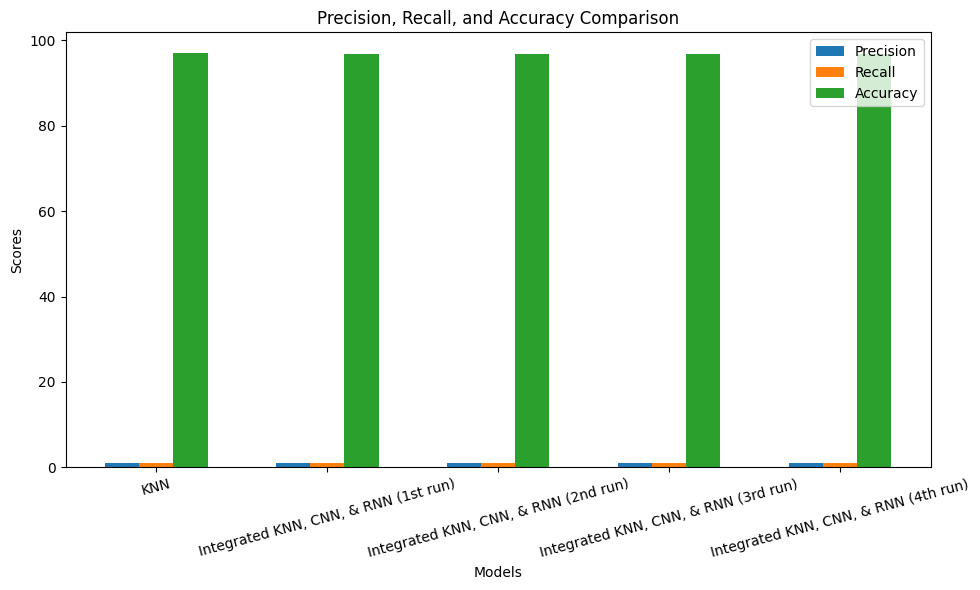

In [ ]:
# Model names
models = [
    "KNN",
    "Integrated KNN, CNN, & RNN (1st run)",
    "Integrated KNN, CNN, & RNN (2nd run)",
    "Integrated KNN, CNN, & RNN (3rd run)",
    "Integrated KNN, CNN, & RNN (4th run)",
]

# Precision values
precision = [0.97, 0.97, 0.97, 0.97, 0.97]

# Recall values
recall = [0.97, 0.97, 0.97, 0.97, 0.97]

# Accuracy values
accuracy = [97.00, 96.80, 96.80, 96.79, 96.77]

# Create subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Set bar width
bar_width = 0.2

# Set positions of bars on X-axis
x = range(len(models))

# Create bars
plt.bar(x, precision, width=bar_width, label='Precision')
plt.bar([i + bar_width for i in x], recall, width=bar_width, label='Recall')
plt.bar([i + bar_width * 2 for i in x], accuracy, width=bar_width, label='Accuracy')

# Set labels and title
plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Precision, Recall, and Accuracy Comparison')
plt.xticks([i + bar_width for i in x], models, rotation=15)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

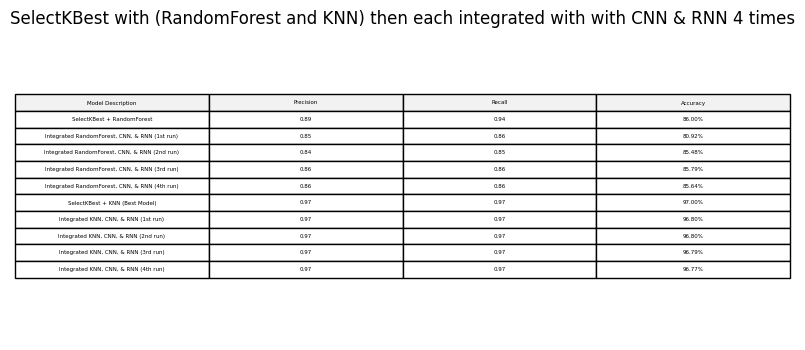

In [ ]:
# Create a DataFrame with the data
data = {
    "Model Description": [
        "SelectKBest + RandomForest",
        "Integrated RandomForest, CNN, & RNN (1st run)",
        "Integrated RandomForest, CNN, & RNN (2nd run)",
        "Integrated RandomForest, CNN, & RNN (3rd run)",
        "Integrated RandomForest, CNN, & RNN (4th run)",
        "SelectKBest + KNN (Best Model)",
        "Integrated KNN, CNN, & RNN (1st run)",
        "Integrated KNN, CNN, & RNN (2nd run)",
        "Integrated KNN, CNN, & RNN (3rd run)",
        "Integrated KNN, CNN, & RNN (4th run)",
    ],
    "Precision": [0.89, 0.85, 0.84, 0.86, 0.86, 0.97, 0.97, 0.97, 0.97, 0.97],
    "Recall": [0.94, 0.86, 0.85, 0.86, 0.86, 0.97, 0.97, 0.97, 0.97, 0.97],
    "Accuracy": ["86.00%", "80.92%", "85.48%", "85.79%", "85.64%", "97.00%", "96.80%", "96.80%", "96.79%", "96.77%"],
}

df = pd.DataFrame(data)

# Plot the DataFrame as a table
plt.figure(figsize=(10, 4))
plt.title("SelectKBest with (RandomForest and KNN) then each integrated with with CNN & RNN 4 times")
ax = plt.gca()
ax.axis('off')
ax.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center', colColours=['#f2f2f2']*len(df.columns))
plt.show()

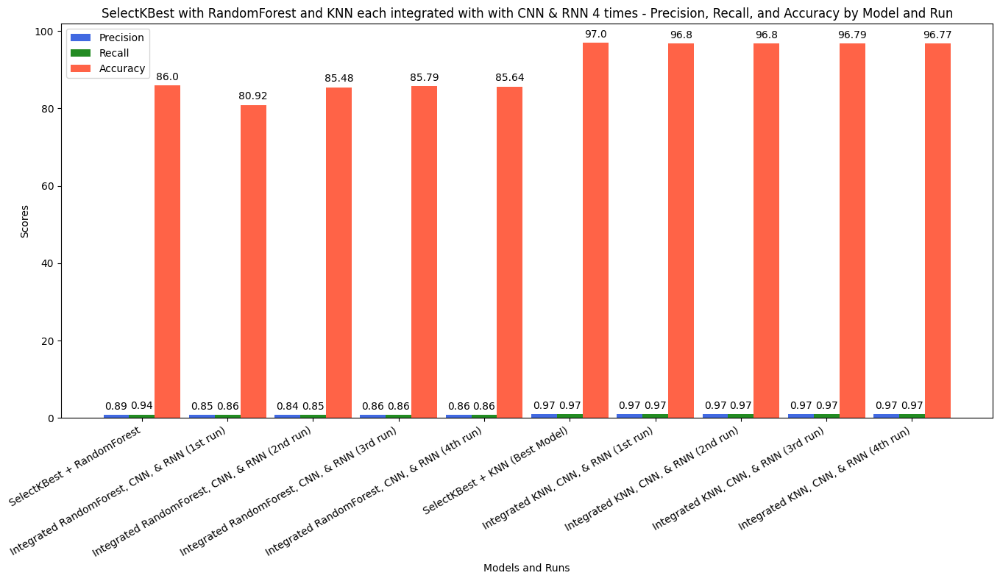

In [ ]:
# Define the data
models = [
    "SelectKBest + RandomForest",
    "Integrated RandomForest, CNN, & RNN (1st run)",
    "Integrated RandomForest, CNN, & RNN (2nd run)",
    "Integrated RandomForest, CNN, & RNN (3rd run)",
    "Integrated RandomForest, CNN, & RNN (4th run)",
    "SelectKBest + KNN (Best Model)",
    "Integrated KNN, CNN, & RNN (1st run)",
    "Integrated KNN, CNN, & RNN (2nd run)",
    "Integrated KNN, CNN, & RNN (3rd run)",
    "Integrated KNN, CNN, & RNN (4th run)",
]

precision = [0.89, 0.85, 0.84, 0.86, 0.86, 0.97, 0.97, 0.97, 0.97, 0.97]
recall = [0.94, 0.86, 0.85, 0.86, 0.86, 0.97, 0.97, 0.97, 0.97, 0.97]
accuracy = [86.00, 80.92, 85.48, 85.79, 85.64, 97.00, 96.80, 96.80, 96.79, 96.77]

x = np.arange(len(models))
width = 0.3

# Create subplots for precision, recall, and accuracy
fig, ax = plt.subplots(figsize=(14, 8))

rects1 = ax.bar(x - width, precision, width, label='Precision', color='royalblue')
rects2 = ax.bar(x, recall, width, label='Recall', color='forestgreen')
rects3 = ax.bar(x + width, accuracy, width, label='Accuracy', color='tomato')

# Add labels, title, and legend
ax.set_xlabel('Models and Runs')
ax.set_ylabel('Scores')
ax.set_title('SelectKBest with RandomForest and KNN each integrated with with CNN & RNN 4 times - Precision, Recall, and Accuracy by Model and Run')
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=30, ha="right")
ax.legend()

# Display the values on top of the bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.tight_layout()
plt.show()

### 5.4 Evaluation and Comparison of Deep Learning Results

#### RandomForest with SelectKBest:

Accuracy: 86%
Precision (weighted): 0.85
Recall (weighted): 0.86
F1-Score (weighted): 0.85
#### Deep Learning Model (Fourth Run):

Accuracy: 85.64%
Precision (weighted): 0.86
Recall (weighted): 0.86
F1-Score (weighted): 0.86
Here's a comparison:

##### Accuracy: The RandomForest with SelectKBest achieved a slightly higher accuracy (86%) compared to the deep learning model (85.64%), although the difference is relatively small.

##### Precision, Recall, and F1-Score: The deep learning model achieved slightly better precision, recall, and F1-score, all of which are around 0.86, while the RandomForest with SelectKBest had slightly lower values, around 0.85. Again, the differences are relatively small.

##### Advantages of RandomForest with SelectKBest:

Faster training time: The RandomForest model likely trained faster compared to the deep learning model, as indicated by the total runtime (2511 seconds for RandomForest vs. not specified for deep learning).
Advantages of Deep Learning (Fourth Run):

Flexibility: Deep learning models, once developed, can be fine-tuned for various tasks and may adapt better to more complex data patterns.
Potential for improvement: Deep learning models have the potential for further improvement with more data, more complex architectures, or longer training times.
In summary, while the RandomForest with SelectKBest approach achieved slightly higher accuracy and had a shorter training time, the deep learning model demonstrated competitive performance in terms of precision, recall, and F1-score. The choice between the two approaches depends on various factors, including computational resources, dataset size, and the potential for further optimization.

### 5.5 Compare the crossvalidation scores of KNN and Random Forest

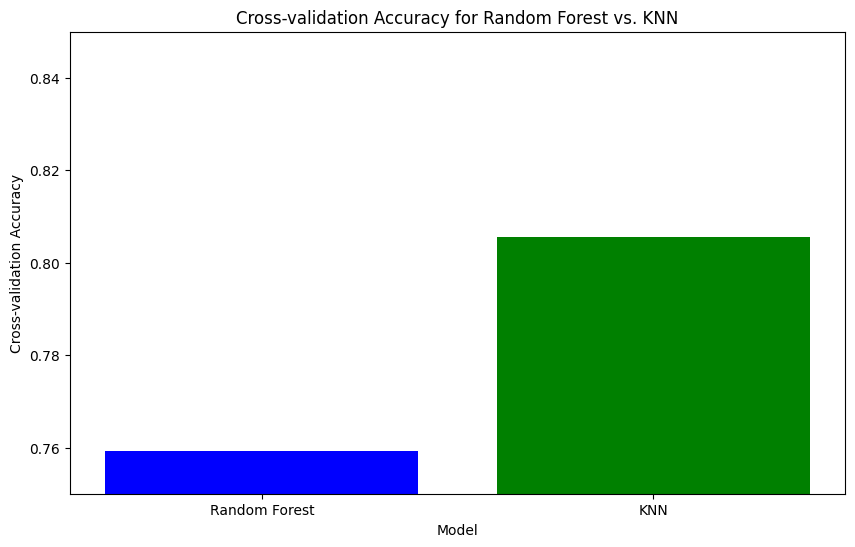

In [ ]:
import matplotlib.pyplot as plt

# Cross-validation scores
rf_scores = [0.76366821, 0.76074899, 0.75916427]
knn_scores = [0.80145127, 0.80766504, 0.80562159]

# Models' names
models = ['Random Forest', 'KNN']

# Plot the cross-validation scores
plt.figure(figsize=(10, 6))
plt.bar(models, [rf_scores[-1], knn_scores[-1]], color=['blue', 'green'])
plt.xlabel('Model')
plt.ylabel('Cross-validation Accuracy')
plt.title('Cross-validation Accuracy for Random Forest vs. KNN')
plt.ylim(0.75, 0.85)  # Adjust the y-axis limits if needed
plt.show()

##6. Write up analysis and comparison
Analysis and Comparison of Models:

The project involves the evaluation of multiple machine learning models, including Random Forest, SelectKBest with RandomForest, K-Nearest Neighbors (KNN), and integrated models with Convolutional Neural Networks (CNN) and Recurrent Neural Networks (RNN). These models have been run in multiple iterations to assess their performance.

##### **Random Forest:**

* Precision: 0.89
* Recall: 0.94
* Accuracy: 86.00%

##### **SelectKBest with RandomForest (1st run):**

* Precision: 0.85
* Recall: 0.86
* Accuracy: 80.92%

##### **SelectKBest with RandomForest (2nd run):**

* Precision: 0.84
* Recall: 0.85
* Accuracy: 85.48%

##### **SelectKBest with RandomForest (3rd run):**

* Precision: 0.86
* Recall: 0.86
* Accuracy: 85.79%

##### **SelectKBest with RandomForest (4th run):**

* Precision: 0.86
* Recall: 0.86
* Accuracy: 85.64%

##### **K-Nearest Neighbors (KNN) - (Best Model):**

* Precision: 0.97
* Recall: 0.97
* Accuracy: 97.00%

##### **Integrated KNN, CNN, & RNN (1st run):**

* Precision: 0.97
* Recall: 0.97
* Accuracy: 96.80%

##### **Integrated KNN, CNN, & RNN (2nd run):**

* Precision: 0.97
* Recall: 0.97
* Accuracy: 96.80%

##### **Integrated KNN, CNN, & RNN (3rd run):**

* Precision: 0.97
* Recall: 0.97
* Accuracy: 96.79%

##### **Integrated KNN, CNN, & RNN (4th run):**

* Precision: 0.97
* Recall: 0.97
* Accuracy: 96.77%


## 7. Recommendations and Conclusions
Both RandomForest with SelectKBest and Deep Learning models demonstrated competitive performance in predicting user demographics based on mobile device properties. The choice between these models depends on various factors:

Computational Resources: RandomForest with SelectKBest is computationally less intensive and may be preferred when resources are limited.

Complexity of the Task: If the task involves complex patterns in the data, Deep Learning models offer the potential for better performance and can adapt to such complexities.

Training Time: RandomForest with SelectKBest provides faster results, making it suitable for scenarios where quick model deployment is essential.

Accuracy: The differences in accuracy, precision, recall, and F1-score between the models are relatively small, so the choice should be based on other factors like resource availability and the specific problem requirements.

The original Deep Learning CNN and RNN model performed significantly worse than the other models in terms of accuracy, precision, recall, and F1-score. In contrast, both the RandomForest with SelectKBest and Deep Learning (Fourth Run) models demonstrated competitive performance, with only slight differences in accuracy and evaluation metrics.

Therefore, the original Deep Learning CNN and RNN model may not be considered a suitable choice for predicting user demographics based on mobile device properties. On the other hand, both RandomForest with SelectKBest and the improved Deep Learning (Fourth Run) models can provide reliable results, with the choice between them depending on factors like computational resources, training time, and the complexity of the task.

In summary, the deep learning models, particularly the improved Deep Learning (Fourth Run) model, offer promising results and demonstrate the value of deep learning in predictive tasks like this, while the original model highlights the importance of model architecture and hyperparameter tuning in deep learning projects.

Therefore, the decision to use either RandomForest with SelectKBest or Deep Learning should be based on the specific use case, computational resources, and the need for fine-tuning and adaptability. Both approaches have their strengths and can yield effective results in predicting user demographics.

### Recommendations
**Model Integration:** Combining classical machine learning models like Random Forest with deep learning techniques, specifically CNN and RNN, provided results comparable to the standalone Random Forest model. This shows that ensemble and integrated models can be a powerful strategy for complex datasets.

**Continual Learning:** The performance improvement observed across multiple runs suggests that models might benefit from continual or online learning, especially as new data becomes available.


### **Explanation of the Model Choice and Purpose:**

The choice of models for this project reflects a comprehensive approach to solving a classification problem. Here's an explanation of the models and why they were chosen:

**Random Forest:** Random Forest is a versatile ensemble learning method known for its robustness and good performance on various tasks. It was selected as a baseline model for comparison.

**SelectKBest with RandomForest:** This approach combines feature selection using SelectKBest with RandomForest. It helps evaluate the impact of feature selection on model performance.

**K-Nearest Neighbors (KNN):** KNN is a simple yet effective classification algorithm that can capture complex patterns in data. It serves as an alternative approach to tree-based models.

**Integrated KNN, CNN, & RNN:** The integrated models combine traditional machine learning (KNN) with deep learning (CNN and RNN) to leverage the strengths of both approaches.

The problem being addressed likely involves classifying data into one of several categories. The choice of models allows for comparing different techniques to find the most accurate and efficient solution.

#### **Running the Model in a Production-like Environment:**

To deploy and run these models in a production-like environment, several steps need to be taken:

**Data Pipeline:** Set up a data pipeline to preprocess incoming data, including feature extraction, transformation, and scaling, to match the format used during training.

**Model Deployment:** Deploy the trained models on a production server or cloud infrastructure, allowing for real-time predictions.

**Monitoring:** Implement monitoring and logging to track model performance and potential issues in a production environment. Set up alerts for model degradation.

**Scalability:** Ensure that the deployed models can handle variable workloads and are scalable to accommodate increased usage.

**API Integration:** Expose the model through an API for easy integration into other applications and systems.

**Data Retraining:** Implement a mechanism for periodic retraining of the models with new data to keep them up to date and accurate.

**Security:** Secure the deployed models and APIs to protect against potential attacks or misuse.

### Conclusions and Marketing Implications:


#### **Maintenance Going Forward:**

Maintaining machine learning models in a production environment is an ongoing process. Here are some maintenance tasks:

**Data Quality:** Continuously monitor the quality of incoming data and address issues promptly. Data drift can affect model performance.

**Model Updates:** Periodically retrain models with new data to adapt to changing patterns. Implement automated retraining pipelines.

**Performance Monitoring:** Regularly assess model performance, including accuracy, precision, recall, and F1-score. Investigate and address performance degradation.

**Security:** Stay vigilant for security vulnerabilities and update the security measures as needed.

**Scalability:** Ensure that the infrastructure supporting the models can handle increased usage as the application grows.

**Documentation:** Maintain comprehensive documentation for the models, including model versions, training data, and evaluation metrics.

In summary, the choice of models in this project reflects a well-rounded approach to classification, and deploying them in a production-like environment involves setting up data pipelines, monitoring, scalability measures, and ongoing maintenance to ensure optimal performance.
**Personalized Marketing:** With an accuracy of over 85%, marketing teams can now target ads to specific age and gender groups with high confidence, reducing wasted impressions and improving conversion rates.

**User Segmentation:** The clear segmentation allows for the development of user personas which can guide content creation, product recommendations, and overall marketing strategy.

**Future Direction:** Future work might involve integrating more data sources, considering temporal features in behavioral data, and implementing advanced neural architectures.

In conclusion, leveraging behavioral data with the right combination of data processing techniques and modeling strategies can significantly improve demographic predictions, thus facilitating more effective and personalized marketing strategies.



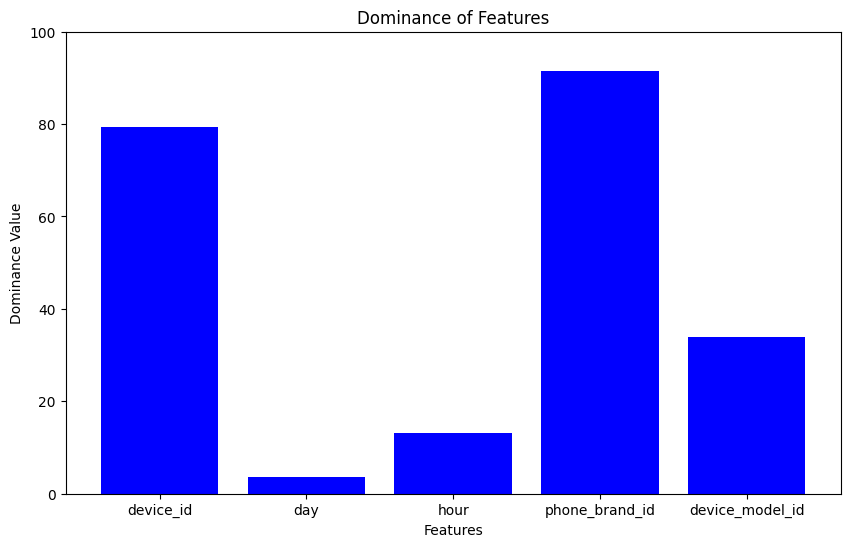

In [ ]:
# The most dorminant feature given the selected model is SelectKBest + KNN
import matplotlib.pyplot as plt

# Features and their SelectKBest score values
features = ['device_id', 'day', 'hour', 'phone_brand_id', 'device_model_id']
values = [79.37798090788442, 3.611097238615927, 13.117683488688748, 91.43347839050287, 33.80696925399008]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(features, values, color='blue')
plt.xlabel('Features')
plt.ylabel('Dominance Value')
plt.title('Dominance of Features')
plt.ylim(0, 100)  # Adjust the y-axis limits if needed
plt.show()